# Script to analyse the squirmer model simulation with Kapsel
# Author: Federico Fadda
# For suggestions please contact me at $\textit{fede.fadda1110@gmail.com}$ or call me via Skype at $\textit{fedefadda}$.
# References:
# J.J. Molina et al. Soft Matter, 2013, 9, 4923 https://pubs.rsc.org/en/content/articlepdf/2013/sm/c3sm00140g
# N. Oyama et al. Phys. Rev. E 93, 043114 (2016) https://journals.aps.org/pre/pdf/10.1103/PhysRevE.93.043114
# N. Oyama et al. Eur. Phys. J. E (2017) 40: 95 https://link.springer.com/content/pdf/10.1140%2Fepje%2Fi2017-11586-4.pdf
# N. Oyama et al. J. Phys. Soc. Japan, 86, 10, 101008, (2017) https://journals.jps.jp/doi/10.7566/JPSJ.86.101008
# N. Oyama et al. arXiv:1612.00135 https://arxiv.org/abs/1612.00135

In [394]:
# Loading some usuful libraries of Python:

%matplotlib inline
import numpy as np
import h5py
import matplotlib.pyplot as plt
plt.rc('text', usetex=True)
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
import math 
from scipy import optimize
import matplotlib.pyplot as plt
from scipy import interpolate 
from scipy.interpolate import RegularGridInterpolator
from scipy.optimize import curve_fit
import os
from natsort import natsorted
from glob import glob
import sys
import random
#from  goto  import  goto , label


ModuleNotFoundError: No module named 'goto'

# Theoretical flow field of the squirmer with formula (3) of J.J. Molina et al. Soft Matter, 2013, 9, 4923-4936

$\mathbf{u}(\mathbf{r})=B_{1}\frac{a^{2}}{r^{2}}\left [ \frac{a}{r} \left ( \frac{2}{3}\mathbf{e} +\sin\theta\boldsymbol{\theta} \right ) +\frac{\alpha}{2}\left \{ \left ( \frac{a^{2}}{r^2}-1 \right )(3\cos^{2}\theta-1)\mathbf{r}+\frac{a^2}{r^{2}}\sin2\theta\boldsymbol{\theta} \right \}\right ]$

a = radius of the squirmer
<br>
$B_{1}$ and $B_{2}$ = first two squirmer modes
<br>
$\textbf{e}$ = direction of motion of the squirmer
<br>
$\boldsymbol{\theta}$ = polar angle between the direction of motion e and a point on the surface of the squirmer
<br>
$\textbf{r}$ = radial unit vector


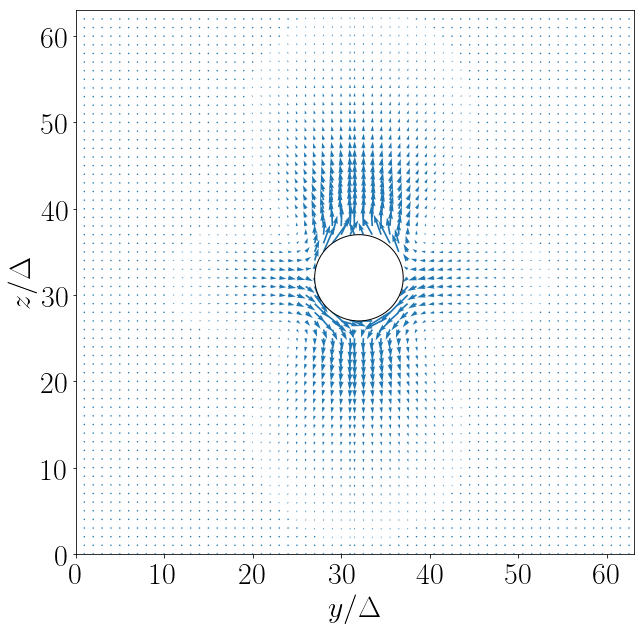

In [8]:
n = 63
y, z = np.mgrid[n/2:n, 0:n]
a=5.0
y_cm=32.0
z_cm=32.0
r=np.sqrt((y-y_cm)**2+(z-z_cm)**2)
B1=0.0015
C2=0.1
alpha=-4.0
cos_theta=(z-z_cm)/r
sin_theta=np.sqrt(1.0-cos_theta**2)
sin_2theta=2.0*sin_theta*cos_theta


    
uy= B1*(a**2/r**2)*((a/r)*sin_theta*cos_theta+alpha*0.5*(((a**2/r**2)-1.0)*(3.0*cos_theta**2-1.0)*sin_theta+(a**2/r**2)*sin_2theta*cos_theta))#+3.0*sin_2theta*C2*a**3/(2.0*r**3)
uz= B1*(a**2/r**2)*((a/r)*0.66-(a/r)*sin_theta**2+alpha*0.5*(((a**2/r**2)-1.0)*(3.0*cos_theta**2-1.0)*cos_theta-(a**2/r**2)*sin_2theta*sin_theta))#-0.001


inner1 = r < a
uy[inner1] =0.0
uz[inner1] =0.0


y1, z1 = np.mgrid[0:n/2, 0:n]
r1=np.sqrt((y1-y_cm)**2+(z1-z_cm)**2)
cos_theta1=(z1-z_cm)/r1
sin_theta1=np.sqrt(1.0-cos_theta1**2)
sin_2theta1=2.0*sin_theta1*cos_theta1


    
uy1= B1*(a**2/r1**2)*(-(a/r1)*sin_theta1*cos_theta1+alpha*0.5*(-((a**2/r1**2)-1.0)*(3.0*cos_theta1**2-1.0)*sin_theta1-(a**2/r1**2)*sin_2theta1*cos_theta1))#+3.0*sin_2theta*C2*a**3/(2.0*r**3)
uz1= B1*(a**2/r1**2)*((a/r1)*0.66-(a/r1)*sin_theta1**2+alpha*0.5*(((a**2/r1**2)-1.0)*(3.0*cos_theta1**2-1.0)*cos_theta1-(a**2/r1**2)*sin_2theta1*sin_theta1))#-0.001

inner2 = r1 < a
uy1[inner2] =0.0
uz1[inner2] =0.0

fig, ax = plt.subplots(figsize=(10, 10))
ax.quiver(y, z, uy, uz, scale=0.05, width=0.003,color='C0')
ax.quiver(y1, z1, uy1, uz1, scale=0.05, width=0.003,color='C0')
plt.xlabel(r'$y/\Delta$',fontsize=30)
plt.ylabel(r'$z/\Delta$',fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlim((0,63))
plt.ylim((0,63))

circle=patches.Circle((32.0,32.0),5,facecolor='white',edgecolor='black',linewidth=1,zorder=10)
ax.add_patch(circle)



plt.show()

                                               

# Theoretical azimuthal flow field of the squirmer with formula (23) of O. Pak et al. J. Eng. Math. (2014) 88:1-28


$\sum_{n=1}^{\infty}\frac{\sin\theta P^{m'}_{n}}{r^{n+1}}C_{0n}\boldsymbol{e_\phi}$


$C_{0n}$ = new azimuthal modes
<br>
$\boldsymbol{e_{\phi}}$ = azimuthal unit vector

/Users/federico/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in true_divide
/Users/federico/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in multiply
/Users/federico/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in true_divide
/Users/federico/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: divide by zero encountered in true_divide
/Users/federico/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in multiply
/Users/federico/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


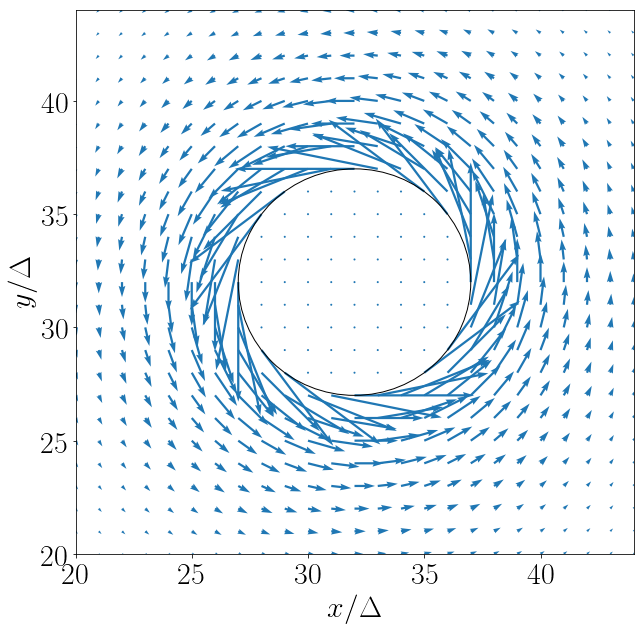

In [2]:
n = 63
x, y = np.mgrid[0:n, 0:n]
a=5.0
x_cm=32.0
y_cm=32.0
r=np.sqrt((x-x_cm)**2+(y-y_cm)**2)
C1=0.0
C2=0.001
C3=0.0
C4=0.0
C5=0.0
theta=np.pi*0.25


           
phi=np.arctan2((y-y_cm),(x-x_cm))
                


ux=(1/r**2)*np.sin(theta)*np.sin(phi)*C1*a**2+3.0*np.sin(2.0*theta)*C2*a**3*np.sin(phi)/(2.0*r**3)+1.5*C3*a**4*np.sin(phi)*np.sin(theta)*(5.0*np.cos(theta)**2-1.0)/(r**4)+2.5*(7.0*np.cos(theta)**3-3.0*np.cos(theta))*np.sin(theta)*np.sin(phi)*C4*a**5/(r**5)+1.875*(21.0*np.cos(theta)**4-14.0*np.cos(theta)**2+1.0)*np.sin(theta)*np.sin(phi)*C5*a**6/(r**6)
uy=-(1/r**2)*np.sin(theta)*np.cos(phi)*C1*a**2-3.0*np.sin(2.0*theta)*C2*a**3*np.cos(phi)/(2.0*r**3)-1.5*C3*a**4*np.cos(phi)*np.sin(theta)*(5.0*np.cos(theta)**2-1.0)/(r**4)-2.5*(7.0*np.cos(theta)**3-3.0*np.cos(theta))*np.sin(theta)*np.cos(phi)*C4*a**5/(r**5)-1.875*(21.0*np.cos(theta)**4-14.0*np.cos(theta)**2+1.0)*np.sin(theta)*np.cos(phi)*C5*a**6/(r**6)
inner = r < a
ux[inner] = 0.0 #3e-4*(y[inner]-y_cm)
uy[inner] = 0.0 #-3e-4*(x[inner]-x_cm)

fig, ax = plt.subplots(figsize=(10, 10))
ax.quiver(x, y, -ux, -uy, scale=0.007, width=0.004,color='C0')
plt.xlabel('$x/\Delta$',fontsize=30)
plt.ylabel('$y/\Delta$',fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlim((20,44))
plt.ylim((20,44))


circle=patches.Circle((32.0,32.0),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)
ax.add_patch(circle)
plt.show()



In [807]:
#Azimuthal average new --> TO BE IMPLEMENTED!!!
#This calculation stands for janus axis  = Z. The squirmer moves along the vertical z axis!

rf = "/Users/federico/mnt/ebi/kapsel3/B1_fixed_B2_C2/0_3/output/data.h5"
f = h5py.File(rf, 'r')


# Reading the coordinates x, y and z:

X=f['system_data/field/x'].value
Y=f['system_data/field/y'].value
Z=f['system_data/field/z'].value


# Reading the concentration field phi, the fluid velocity components, the position and the velocity of the particle:

PHI=f['trajectory_data/frame_300/field/phi'].value
UX=f['trajectory_data/frame_300/field/u_x'].value
UY=f['trajectory_data/frame_300/field/u_y'].value
UZ=f['trajectory_data/frame_300/field/u_z'].value
                    
xcm=32.0
ycm=32.0
zcm=46.9366

Lx=64
Ly=64
Lz=64

Delta=1.0

dx=np.zeros(((Lx,Ly,Lz)))
dy=np.zeros(((Lx,Ly,Lz)))
dz=np.zeros(((Lx,Ly,Lz)))

r=np.zeros(((Lx,Ly,Lz)))
cos_theta=np.zeros(((Lx,Ly,Lz)))
sin_theta=np.zeros(((Lx,Ly,Lz)))
phi_angle=np.zeros(((Lx,Ly,Lz)))

e2=np.zeros(((Lx,Ly,Lz)))
e3=np.zeros(((Lx,Ly,Lz)))
u_e2=np.zeros(((Lx,Ly,Lz)))
u_e3=np.zeros(((Lx,Ly,Lz)))
                

#Check of PBC condtions along x, y and z directions:    
    
for i in range(0,Lx):
    for j in range(0,Ly):
        for k in range(0,Lz):
            
            if(abs(i-xcm) < Lx*0.5):
                dx[i,j,k]=i-xcm
            else:
                dx[i,j,k]=Lx-abs(i-xcm)
                
            if(abs(j-ycm) < Ly*0.5):
                dy[i,j,k]=j-ycm
            else:
                dy[i,j,k]=Ly-abs(j-ycm)
                
            if(abs(k-zcm) < Lz*0.5):
                dz[i,j,k]=k-zcm
            else:
                dz[i,j,k]=Lz-abs(k-zcm)



for i in range(0,Lx):
    for j in range(0,Ly):
        for k in range(0,Lz):

            r[i,j,k]=np.sqrt(dx[i,j,k]**2+dy[i,j,k]**2+dz[i,j,k]**2)
            
            cos_theta[i,j,k]=(k-zcm)/r[i,j,k]
            
            sin_theta[i,j,k]=np.sqrt(abs(1.0-cos_theta[i,j,k]**2)) #Here I have the problem of negative argument
                                                                   #numerically cos_theta can be > 1 (~1.02)
                                                                   #the difference must be psotive so I use abs
               
            phi_angle[i,j,k]=np.arctan2((j-ycm),(i-xcm))
                
            e2[i,j,k]=r[i,j,k]*sin_theta[i,j,k]
            
            e3[i,j,k]=r[i,j,k]*cos_theta[i,j,k]
            
            u_e2[i,j,k]=UX[i,j,k]*r[i,j,k]*sin_theta[i,j,k]*math.cos(phi_angle[i,j,k])+r[i,j,k]*sin_theta[i,j,k]*math.sin(phi_angle[i,j,k])*UY[i,j,k]
            
            u_e3[i,j,k]=UZ[i,j,k]

u_e2_med=np.average(u_e2)            
print(u_e2_med)
                
#e2_new=np.zeros((Ly,Lz))
#e3_new=np.zeros((Ly,Lz))
#u2_new=np.zeros((Ly,Lz))
#u3_new=np.zeros((Ly,Lz))
#count=np.zeros((Ly,Lz))

#count=0
#for i in range(0,Lx):
    #for j in range(0,Ly): 
        #for k in range(0,Lz):

#for m in range(0,len(e2)):
    #for n in range(min(e3),max(e3)): 
            
        #if(e2.any()>= m*Delta and e2.any()<= (m+1)*Delta):
            #if(e3.any()>= n*Delta and e3.any()<= (n+1)*Delta):
                #count =+ 1
        #print(count)

                            #if(abs(e3[i,j,k])>= n*Delta and abs(e3[i,j,k])<= (n+1)*Delta): #e3 values are partially positive 
                            #and ngeative
                                #count[m,n]=count[m,n]+1 
                                #u2_new[m,n]=u2_new[m,n]+u_e2[i,j,k]
                                #u3_new[m,n]=u3_new[m,n]+u_e3[i,j,k]
                        #u2_new[m,n]=u2_new[m,n]/count[m,n]
                        #u3_new[m,n]=u3_new[m,n]/count[m,n]
                
#for m in range(0,len(e2)):
    #for n in range(0,len(e3)): 
                        
            #e2_new[m,n]=(m+0.5)*Delta
            #e3_new[m,n]=(n+0.5)*Delta 
        
        
            #if(e2[i,j,k]>= j*Delta and e2[i,j,k]<= (j+1)*Delta):
                #if(e3[i,j,k]>=() and e3[i,j,k]<= ()*Delta):
            
                    
                       
                    

              
                    
        #numbe2=len([index for index,value in enumerate(e2) if value >= m*Delta and value <= (m+1)*Delta])
        #numbe3=len([index for index,value in enumerate(e3) if value >= n*Delta and value <= (n+1)*Delta])
        
        
        #u_e2_med[m]=0.0
        #u_e2_med[m]=sum(u_e2[l] for l in range(len(u_e2)) if r[l]>=n and r[l] <=n+1 and cos_theta[l]>=0.0)
        #u_e2_med[m]=u_e2_med[m]/numbe2


        #u_e3_med[n]=0.0
        #u_e3_med[n]=sum(u_e3[l] for l in range(len(u_e3)) if r[l]>=n and r[l] <=n+1 and cos_theta[l]>=0.0)
        #u_e3_med[n]=u_e3_med[n]/(numb[n]-numb2[n])

        
        

        #u_e2_med[n]=0.0
        #u_e2_med[n]=sum(u_e2[l] for l in range(len(u_e2)) if r[l]>=n and r[l] <=n+1 and cos_theta[l]<0.0)
        #u_e2_med[n]=u_e2_med[n]/(numb[n]-numb1[n])


        #u_e3_med[n]=0.0
        #u_e3_med[n]=sum(u_e3[l] for l in range(len(u_e3)) if r[l]>=n and r[l] <=n+1 and cos_theta[l]<0.0)
        #u_e3_med[n]=u_e3_med[n]/(numb[n]-numb1[n])

        #y_new[m]=(m+0.5)*Delta
        #z_new[n]=(n+0.5)*Delta

        #print(numbe2,numbe3)

#fig, ax = plt.subplots(figsize=(10,10))

#circle=patches.Circle((32.0,32.0),5,facecolor='white',edgecolor='black',linewidth=3,zorder=10)

#ax.quiver(e2_new,e3_new,u_e2_med,u_e3_med,scale=0.005,width=0.005,color='C0')
#plt.xlabel('$x/\Delta$',fontsize=20)
#plt.ylabel('$y/\Delta$',fontsize=20)
#plt.xticks(fontsize=20)
#plt.yticks(fontsize=20)
#plt.xticks(fontsize=20)
#plt.yticks(fontsize=20)
#plt.xlim((0,63))
#plt.ylim((0,63))
#cbar=fig.colorbar(strm.lines)
#cbar.ax.tick_params(labelsize=20)
#cbar.set_label('$u_{x}$, $u_{y}$', rotation=270,size=20)

#ax.add_patch(circle)


#plt.show()

#fig.savefig('up.pdf')
            
#print(u_e2_med,u_e3_med)

#u_e2_av=np.zeros((Ly,Lz))
#u_e3_av=np.zeros((Ly,Lz))
#n_points=0


#for i in range(0,Lx):
    #for j in range(0,m):
        #for k in range(0,n):
            
            
                     #if(e2[i,j,k] <= m+1 and e2[i,j,k]>m for m in range(0,Ly)):
                        #if(e3[i,j,k] <= n+1 and e3[i,j,k]>n for n in range (0,Lz)):
                     
                            #n_points += 1
                            #print(n_points)
                            #u_e2_av[] += u_e2[i,j,k]
                            #u_e3_av[m,n] += u_e3[i,j,k]

        #u_e2_av[m,n]=u_e2_av[m,n]/n_points
        #u_e3_av[m,n]=u_e3_av[m,n]/n_points

        

-4.836221655903555e-05


# SINGLE SQUIRMER ANALYSIS

# Plot of the velocity of the squirmer (U=2/3B1) vs time (left plot):
# Plot the $\omega$ of the squirmer (Omega=-C1/a with a radius of the squirmer) vs time (right plot):
# Plot of the centre of mass of the squirmer vs time (right plot):

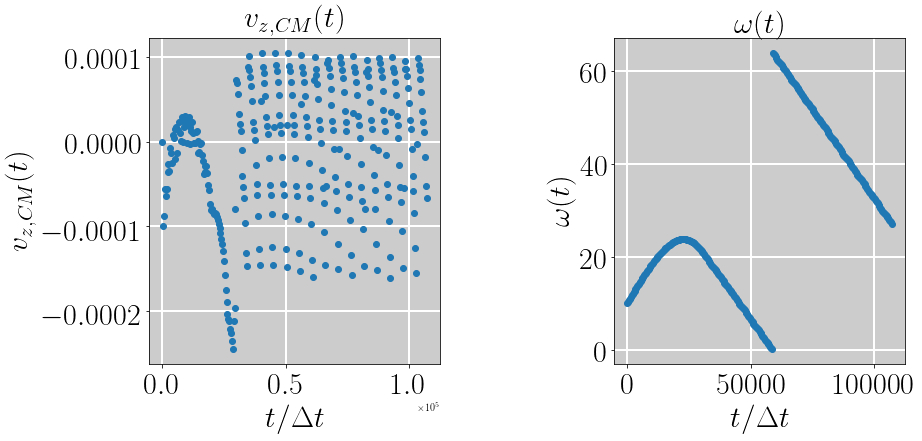

In [141]:
# Plot of the velocity of the squirmer (U=2/3B1) vs time (left plot):
# Plot the $\omega$ of the squirmer (Omega=-C1/a with a radius of the squirmer) vs time (right plot):
# Plot of the centre of mass of the squirmer vs time (left plot):


n_frames = 301
rf = "/Users/federico/mnt/ebi/kapsel3/GRAVITY_WALL/5/0/output/data.h5"
f = h5py.File(rf, 'r')


fig,  (ex,gx) = plt.subplots(1,2,figsize=(15,6))
fig.subplots_adjust(left=0.2, wspace=0.6)


ex.set_xlabel('$t/\Delta t$',fontsize=30)
ex.set_ylabel('$v_{z,CM}(t)$',fontsize=30)
ex.tick_params(axis='both',labelsize=30)
ex.set_title('$v_{z,CM}(t)$',size=30)
ex.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
#ex.set_ylim(0,0.0012)




TIME=np.zeros(n_frames)
VCM=np.zeros((n_frames,3))
CM=np.zeros((n_frames,3))


for n in range (0,n_frames):
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    VCM[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    CM[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value


ex.plot(TIME,VCM[:,2],'o')

########################################

gx.set_xlabel('$t/\Delta t$',fontsize=30)
gx.set_ylabel('$\omega(t)$',fontsize=30)
gx.tick_params(axis='both',labelsize=30)
gx.set_title('$\omega(t)$',size=30)
#gx.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

gx.grid(color='w', linestyle='-',linewidth='2')


TIME=np.zeros(n_frames)
Omeg=np.zeros((n_frames,3))

for n in range (0,n_frames):
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    Omeg[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/omega'].value
    CM[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value

#gx.set_xlim(32,63)
#gx.set_ylim(12,18)

#gx.plot(TIME,Omeg[:,1],'o')
gx.plot(TIME,CM[:,1],'o')
#gx.plot(CM[:,0],CM[:,1],'o',)


ex.grid(color='w', linestyle='-',linewidth='2')
gx.grid(color='w', linestyle='-',linewidth='2')

ex.patch.set_facecolor('0.8')
gx.patch.set_facecolor('0.8')

plt.show()

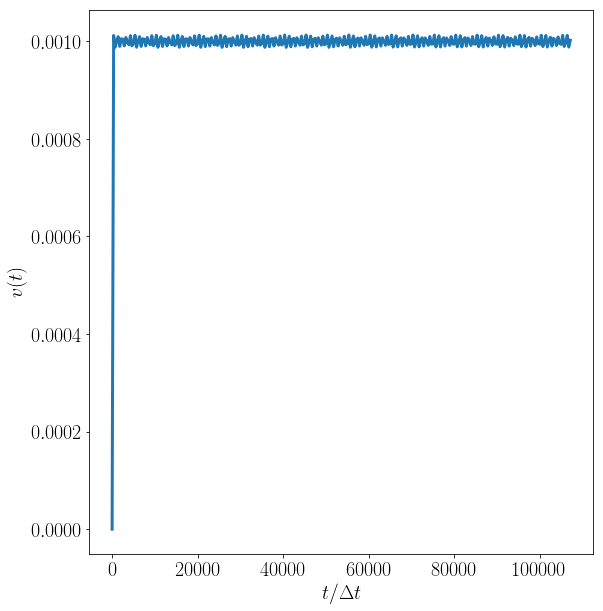

In [259]:
#Angle of swimming of the squirmer vs wall


n_frames = 301
rf = "/Users/federico/mnt/ebi/kapsel3/B1_fixed_B2_C2/0_3/output/data.h5"
f = h5py.File(rf, 'r')


fig,  ex= plt.subplots(figsize=(10,10))
fig.subplots_adjust(left=0.2, wspace=0.6)


ex.set_xlabel('$t/\Delta t$',fontsize=20)
ex.set_ylabel('$v(t)$',fontsize=20)
ex.tick_params(axis='both',labelsize=20)
#ex.set_title('$v_{z,CM}(t)$',size=30)
#ex.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
#ex.set_ylim(0,0.0012)




TIME=np.zeros(n_frames)
VCM=np.zeros((n_frames,3))
CM=np.zeros((n_frames,3))
ANG=np.zeros(n_frames)

for n in range (0,n_frames):
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    VCM[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    CM[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value

    
    #ANG[n]=np.arctan2((CM[n,1]-CM[0,1]),(CM[n,0]-CM[0,0]))

    #ANG[n]=np.arctan2((CM[n,2]-CM[0,2]),(CM[n,1]-CM[0,1]))
    

#ex.plot(TIME,VCM[:,0],'o',label='$v_{x}$')
#ex.plot(TIME,VCM[:,1],'o',label='$v_{y}$')
ex.plot(TIME,VCM[:,2],label='$v_{z}$',linewidth='3')


#legend = ex.legend(title=r"$\alpha=-5$", loc="lower right",shadow='True',fontsize='20')#, title_fontsize = "20")
#legend.get_title().set_fontsize('20')


plt.show()

#fig.savefig('2_3.png') 

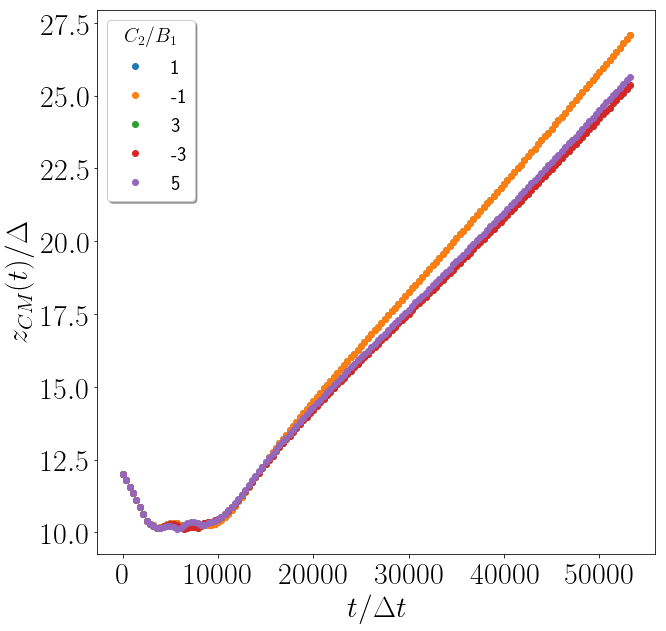

In [51]:
n_frames = 150

ra = "/Users/federico/mnt/ebi/kapsel3/NO_GRAVITY_WALL/DIRECT/-5/0/output/data.h5"
a = h5py.File(ra, 'r')

rb = "/Users/federico/mnt/ebi/kapsel3/NO_GRAVITY_WALL/DIRECT/-5/1/output/data.h5"
b = h5py.File(rb, 'r')

rc = "/Users/federico/mnt/ebi/kapsel3/NO_GRAVITY_WALL/DIRECT/-5/-1/output/data.h5"
c = h5py.File(rc, 'r')

rd = "/Users/federico/mnt/ebi/kapsel3/NO_GRAVITY_WALL/DIRECT/-5/3/output/data.h5"
d = h5py.File(rd, 'r')

re = "/Users/federico/mnt/ebi/kapsel3/NO_GRAVITY_WALL/DIRECT/-5/-3/output/data.h5"
e = h5py.File(re, 'r')

rf = "/Users/federico/mnt/ebi/kapsel3/NO_GRAVITY_WALL/DIRECT/-5/5/output/data.h5"
f = h5py.File(rf, 'r')

rg = "/Users/federico/mnt/ebi/kapsel3/NO_GRAVITY_WALL/DIRECT/-5/-5/output/data.h5"
g = h5py.File(rg, 'r')


#rh = "/Users/federico/mnt/ebi/kapsel3/NO_GRAVITY_WALL/DIRECT/5/1/output/data.h5"
#h = h5py.File(rh, 'r')

#ri = "/Users/federico/mnt/ebi/kapsel3/NO_GRAVITY_WALL/DIRECT/-5/1/output/data.h5"
#i = h5py.File(ri, 'r')

TIME=np.zeros(n_frames)
CM1=np.zeros((n_frames,3))
CM2=np.zeros((n_frames,3))
CM3=np.zeros((n_frames,3))
CM4=np.zeros((n_frames,3))
CM5=np.zeros((n_frames,3))
CM6=np.zeros((n_frames,3))
CM7=np.zeros((n_frames,3))
CM8=np.zeros((n_frames,3))
CM9=np.zeros((n_frames,3))




for n in range (0,n_frames):
    
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
   
    #CM1[n,:]=a['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    CM2[n,:]=b['trajectory_data/frame_'+str(n)+'/particle/pos'].value

    CM3[n,:]=c['trajectory_data/frame_'+str(n)+'/particle/pos'].value

    CM4[n,:]=d['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    CM5[n,:]=e['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    CM6[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
        
    #CM7[n,:]=g['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    #CM8[n,:]=h['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    #CM9[n,:]=i['trajectory_data/frame_'+str(n)+'/particle/pos'].value


    
fig, ex = plt.subplots(figsize=(10,10))
    
    
ex.set_xlabel('$t/\Delta t$',fontsize=30)
ex.set_ylabel('$z_{CM}(t)/\Delta$',fontsize=30)
ex.tick_params(axis='both',labelsize=30)
#ex.set_title('$\alpha=0$',size=30)
 
#ex.plot(TIME,CM1[:,2],'o',label='0')
ex.plot(TIME,CM2[:,2],'o',label='1')
ex.plot(TIME,CM3[:,2],'o',label='-1')
ex.plot(TIME,CM4[:,2],'o',label='3')
ex.plot(TIME,CM5[:,2],'o',label='-3')
ex.plot(TIME,CM6[:,2],'o',label='5')
#ex.plot(TIME,CM7[:,2],'o',label='-5')    
    
#ex.plot(TIME,CM1[:,2],'o',label='0')
#ex.plot(TIME,CM2[:,2],'o',label='0.5')
#ex.plot(TIME,CM3[:,2],'o',label='-0.5')
#ex.plot(TIME,CM4[:,2],'o',label='1')
#ex.plot(TIME,CM5[:,2],'o',label='-1')
#ex.plot(TIME,CM6[:,2],'o',label='2')
#ex.plot(TIME,CM7[:,2],'o',label='-2')
#ex.plot(TIME,CM8[:,2],'o',label='5')
#ex.plot(TIME,CM9[:,2],'o',label='-5')


#legend = ex.legend(title="$B_{2}/B_{1}$", loc="upper left",shadow='True',fontsize='20')#, title_fontsize = "20")

legend = ex.legend(title="$C_{2}/B_{1}$", loc="upper left",shadow='True',fontsize='20')#, title_fontsize = "20")
legend.get_title().set_fontsize('20')

plt.show()

fig.savefig('DIRECT_-5_z.pdf') 

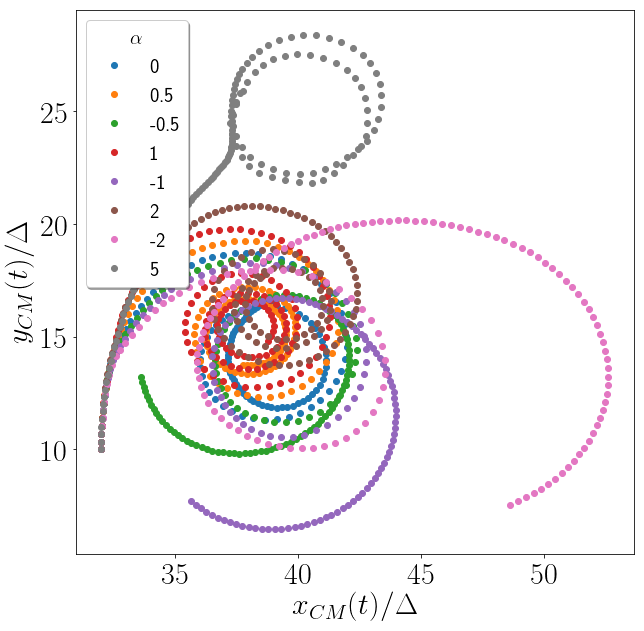

In [133]:
n_frames = 150

ra = "/Users/federico/mnt/ebi/kapsel3/GRAVITY_WALL/0/5/output/data.h5"
a = h5py.File(ra, 'r')

rb = "/Users/federico/mnt/ebi/kapsel3/GRAVITY_WALL/0.5/5/output/data.h5"
b = h5py.File(rb, 'r')

rc = "/Users/federico/mnt/ebi/kapsel3/GRAVITY_WALL/-0.5/5/output/data.h5"
c = h5py.File(rc, 'r')

rd = "/Users/federico/mnt/ebi/kapsel3/GRAVITY_WALL/1/5/output/data.h5"
d = h5py.File(rd, 'r')

re = "/Users/federico/mnt/ebi/kapsel3/GRAVITY_WALL/-1/5/output/data.h5"
e = h5py.File(re, 'r')

rf = "/Users/federico/mnt/ebi/kapsel3/GRAVITY_WALL/2/5/output/data.h5"
f = h5py.File(rf, 'r')

rg = "/Users/federico/mnt/ebi/kapsel3/GRAVITY_WALL/-2/5/output/data.h5"
g = h5py.File(rg, 'r')


rh = "/Users/federico/mnt/ebi/kapsel3/GRAVITY_WALL/5/5/output/data.h5"
h = h5py.File(rh, 'r')

ri = "/Users/federico/mnt/ebi/kapsel3/GRAVITY_WALL/-5/5/output/data.h5"
i = h5py.File(ri, 'r')

TIME=np.zeros(n_frames)
CM1=np.zeros((n_frames,3))
CM2=np.zeros((n_frames,3))
CM3=np.zeros((n_frames,3))
CM4=np.zeros((n_frames,3))
CM5=np.zeros((n_frames,3))
CM6=np.zeros((n_frames,3))
CM7=np.zeros((n_frames,3))
CM8=np.zeros((n_frames,3))
CM9=np.zeros((n_frames,3))




for n in range (0,n_frames):
    
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
   
    CM1[n,:]=a['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    CM2[n,:]=b['trajectory_data/frame_'+str(n)+'/particle/pos'].value

    CM3[n,:]=c['trajectory_data/frame_'+str(n)+'/particle/pos'].value

    CM4[n,:]=d['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    CM5[n,:]=e['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    CM6[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
        
    CM7[n,:]=g['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    CM8[n,:]=h['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    #CM9[n,:]=i['trajectory_data/frame_'+str(n)+'/particle/pos'].value


    
fig, ex = plt.subplots(figsize=(10,10))
    
    
#ex.set_xlabel('$t/\Delta t$',fontsize=30)
ex.set_xlabel('$x_{CM}(t)/\Delta$',fontsize=30)
ex.set_ylabel('$y_{CM}(t)/\Delta$',fontsize=30)
ex.tick_params(axis='both',labelsize=30)
#ex.set_title('$\alpha=0$',size=30)
 
#ex.plot(TIME,CM1[:,2],'o',label='0')
#ex.plot(TIME,CM2[:,2],'o',label='1')
#ex.plot(TIME,CM3[:,2],'o',label='-1')
#ex.plot(TIME,CM4[:,2],'o',label='3')
#ex.plot(TIME,CM5[:,2],'o',label='-3')
#ex.plot(TIME,CM6[:,2],'o',label='5')
#ex.plot(TIME,CM7[:,2],'o',label='-5')    
    
#ex.plot(TIME,CM1[:,2],'o',label='0')
#ex.plot(TIME,CM2[:,2],'o',label='0.5')
#ex.plot(TIME,CM3[:,2],'o',label='-0.5')
#ex.plot(TIME,CM4[:,2],'o',label='1')
#ex.plot(TIME,CM5[:,2],'o',label='-1')
#ex.plot(TIME,CM6[:,2],'o',label='2')
#ex.plot(TIME,CM7[:,2],'o',label='-2')
#ex.plot(TIME,CM8[:,2],'o',label='5')
#ex.plot(TIME,CM9[:,2],'o',label='-5')

#ex.plot(CM1[:,0],CM1[:,1],'o',label='0')
#ex.plot(CM2[:,0],CM2[:,1],'o',label='1')
#ex.plot(CM3[:,0],CM3[:,1],'o',label='-1')
#ex.plot(CM4[:,0],CM4[:,1],'o',label='3')
#ex.plot(CM5[:,0],CM5[:,1],'o',label='-3')
#ex.plot(CM6[:,0],CM6[:,1],'o',label='5')
#ex.plot(CM7[:,0],CM7[:,1],'o',label='-5') 

ex.plot(CM1[:,0],CM1[:,1],'o',label='0')
ex.plot(CM2[:,0],CM2[:,1],'o',label='0.5')
ex.plot(CM3[:,0],CM3[:,1],'o',label='-0.5')
ex.plot(CM4[:,0],CM4[:,1],'o',label='1')
ex.plot(CM5[:,0],CM5[:,1],'o',label='-1')
ex.plot(CM6[:,0],CM6[:,1],'o',label='2')
ex.plot(CM7[:,0],CM7[:,1],'o',label='-2')
ex.plot(CM8[:,0],CM8[:,1],'o',label='5')
#ex.plot(CM9[:,0],CM9[:,1],'o',label='-5')


legend = ex.legend(title=r"$\alpha$", loc="upper left",shadow='True',fontsize='20')#, title_fontsize = "20")

#legend = ex.legend(title="$C_{2}/B_{1}$", loc="upper left",shadow='True',fontsize='20')#, title_fontsize = "20")
legend.get_title().set_fontsize('20')

plt.show()

fig.savefig('GRAVITY_C2_5.pdf') 

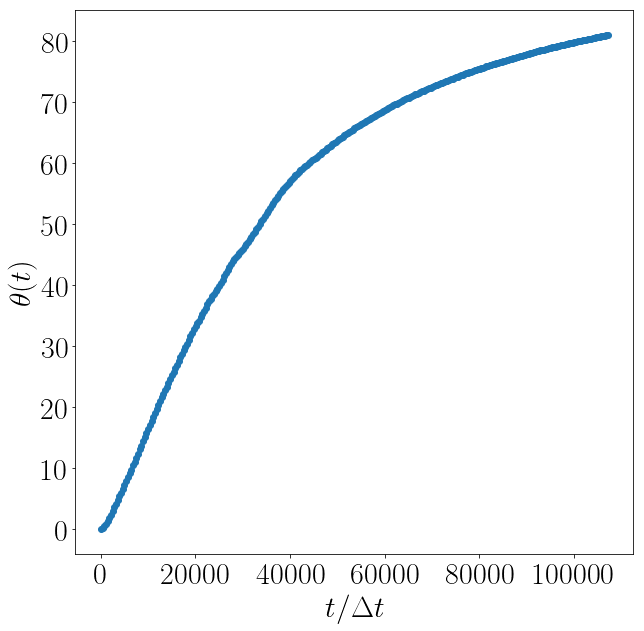

In [201]:
n_frames = 301

ra = "/Users/federico/mnt/ebi/kapsel3/GRAVITY_WALL/2/0/output/data.h5"
a = h5py.File(ra, 'r')

ANGLE=np.zeros(n_frames)
QR=np.zeros(((n_frames,3,3)))
TIME=np.zeros(n_frames)

fig, ex = plt.subplots(figsize=(10,10))
    
    
ex.set_xlabel('$t/\Delta t$',fontsize=30)
#ex.set_xlabel('$x_{CM}(t)/\Delta$',fontsize=30)
ex.set_ylabel(r'$\theta(t)$',fontsize=30)
ex.tick_params(axis='both',labelsize=30)
#ex.set_title('$\alpha=0$',size=30)
 
for n in range (0,n_frames):
    
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
   
    QR[n,:,:]=a['trajectory_data/frame_'+str(n)+'/particle/QR'].value
    
    #ANGLE[n]=np.arctan2(QR[n,2,2],np.sqrt(QR[n,2,0]**2+QR[n,2,1]**2))
    
    ANGLE[n]=(np.arctan2(QR[n,2,2],np.sqrt(QR[n,2,0]**2+QR[n,2,1]**2)))*180.0/np.pi


#legend = ex.legend(title=r"$\alpha$", loc="upper left",shadow='True',fontsize='20')#, title_fontsize = "20")

#legend = ex.legend(title="$C_{2}/B_{1}$", loc="upper left",shadow='True',fontsize='20')#, title_fontsize = "20")
#legend.get_title().set_fontsize('20')

ex.plot(TIME,ANGLE,'o',label='0')



plt.show()

fig.savefig('ANGLE.pdf') 

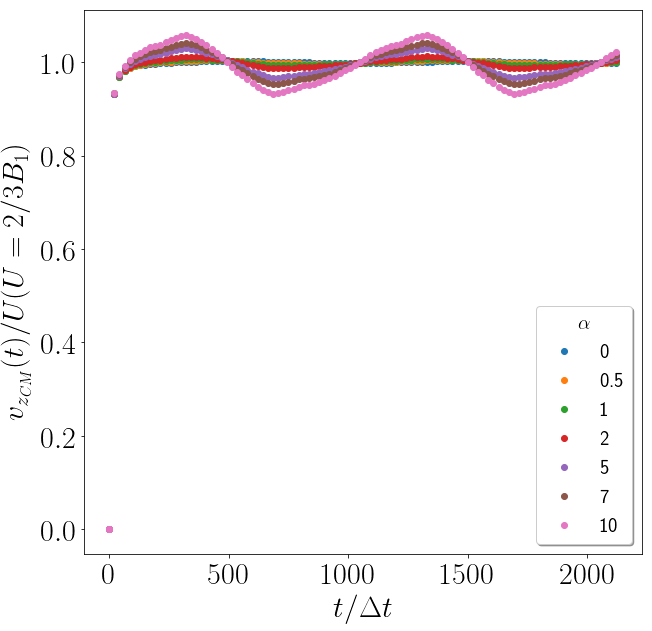

In [81]:
n_frames = 3000

ra = "/Users/federico/mnt/ebi/kapsel3/old_pusher_puller/0/output/data.h5"
a = h5py.File(ra, 'r')

rb = "/Users/federico/mnt/ebi/kapsel3/old_pusher_puller/0.5/output/data.h5"
b = h5py.File(rb, 'r')

rc = "/Users/federico/mnt/ebi/kapsel3/old_pusher_puller/1/output/data.h5"
c = h5py.File(rc, 'r')

rd = "/Users/federico/mnt/ebi/kapsel3/old_pusher_puller/2/output/data.h5"
d = h5py.File(rd, 'r')

re = "/Users/federico/mnt/ebi/kapsel3/old_pusher_puller/5/output/data.h5"
e = h5py.File(re, 'r')

rf = "/Users/federico/mnt/ebi/kapsel3/old_pusher_puller/7/output/data.h5"
f = h5py.File(rf, 'r')

rg = "/Users/federico/mnt/ebi/kapsel3/old_pusher_puller/10/output/data.h5"
g = h5py.File(rg, 'r')


TIME=np.zeros(n_frames)
VCM1=np.zeros((n_frames,3))
VCM2=np.zeros((n_frames,3))
VCM3=np.zeros((n_frames,3))
VCM4=np.zeros((n_frames,3))
VCM5=np.zeros((n_frames,3))
VCM6=np.zeros((n_frames,3))
VCM7=np.zeros((n_frames,3))
VCM8=np.zeros((n_frames,3))
VCM9=np.zeros((n_frames,3))




for n in range (0,n_frames,30):
    
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
   
    VCM1[n,:]=a['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    
    VCM2[n,:]=b['trajectory_data/frame_'+str(n)+'/particle/vel'].value

    VCM3[n,:]=c['trajectory_data/frame_'+str(n)+'/particle/vel'].value

    VCM4[n,:]=d['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    
    VCM5[n,:]=e['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    
    VCM6[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
        
    VCM7[n,:]=g['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    

    
fig, ex = plt.subplots(figsize=(10,10))
    
    
ex.set_xlabel('$t/\Delta t$',fontsize=30)
ex.set_ylabel('$v_{z_{CM}}(t)/U (U=2/3B_1)$',fontsize=30)
ex.tick_params(axis='both',labelsize=30)
#ex.set_title('$\alpha=0$',size=30)
 
ex.plot(TIME,VCM1[:,2]/0.001,'o',label='0')
ex.plot(TIME,VCM2[:,2]/0.001,'o',label='0.5')
ex.plot(TIME,VCM3[:,2]/0.001,'o',label='1')
ex.plot(TIME,VCM4[:,2]/0.001,'o',label='2')
ex.plot(TIME,VCM5[:,2]/0.001,'o',label='5')
ex.plot(TIME,VCM6[:,2]/0.001,'o',label='7')
ex.plot(TIME,VCM7[:,2]/0.001,'o',label='10')    
    


#legend = ex.legend(title="$B_{2}/B_{1}$", loc="upper left",shadow='True',fontsize='20')#, title_fontsize = "20")

legend = ex.legend(title=r'$\alpha$', loc="lower right",shadow='True',fontsize='20')#, title_fontsize = "20")
legend.get_title().set_fontsize('20')

plt.show()

fig.savefig('FLUCT.png') 

In [459]:
a=[[0,1,2],[0,1,2]]
#print(*a,sep='\n')
a.pop(0)
print(*a,sep='\n')
#print(a[0])

[0, 1, 2]


In [432]:
data=np.zeros((1024,3))

In [464]:
#for n in range (0,1024):

R=5.0 

for n in range (0,1024):
    
    data[n,0]=63.0*random.random()
    data[n,1]=63.0*random.random()
    data[n,2]=0.0
    
    for m in range(0,n):
    
        #r_core=np.sqrt((data[n,0]-data[m,0])**2+(data[n,1]-data[m,1])**2)
        #if(r_core < 0.5*R and n > 0):
        r_x = np.abs(data[n,0]-data[m,0])
        r_y = np.abs(data[n,1]-data[m,1])
        if(r_x < 0.5*R and r_y < 0.5*R):
            #data[0,0]=data[n,0]
            #data[0,1]=data[n,1]
            #data[0,2]=data[n,2]
            
            #del data[n,:]

#print(*data[:,0],sep='\n')
#print(data[:,0])
#print(*data[:,0],sep='\n')

SyntaxError: unexpected EOF while parsing (<ipython-input-464-f917a16558b1>, line 26)

In [442]:
for r in data:
    print('{{%.3f %.3f %.3f} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}' % (r[0], r[1], r[2]))

{{20.390 46.067 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{2.190 55.596 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{44.304 28.498 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{51.124 50.204 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{23.408 25.642 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{34.353 37.381 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{46.299 41.205 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{45.909 28.300 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{6.720 0.967 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{57.692 33.038 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{57.927 56.546 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{29.963 19.721 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{59.922 49.255 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{

In [370]:

for n in range (0,1):
    
        data[n,0]=0.0
        data[n,1]=0.0
        data[n,2]=0.0
    


In [371]:
for r in data:
    print('{{%.3f %.3f %.3f} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}' % (r[0], r[1], r[2]))

{{0.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.000 0.000} {0.0, 0.0, 0.0} {1.0, 0.0, 0.0, 0.0} {0.0, 0.0, 0.0}}
{{56.000 0.00

# Polar velocity field of the single squirmer:


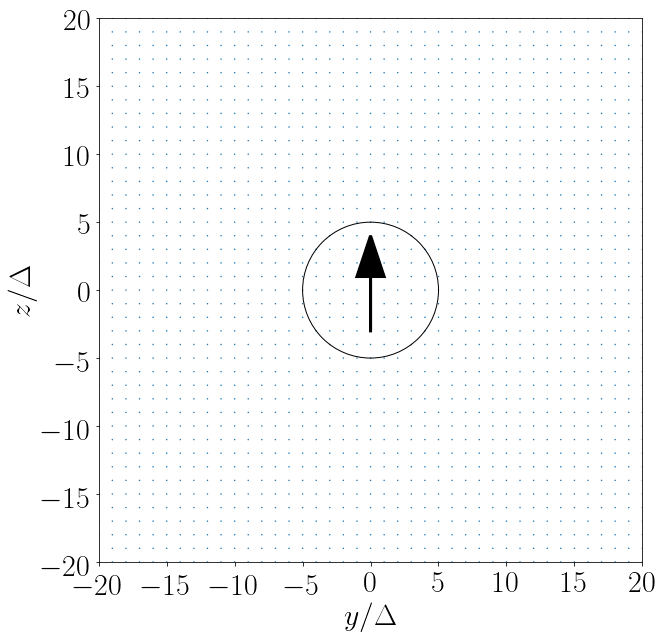

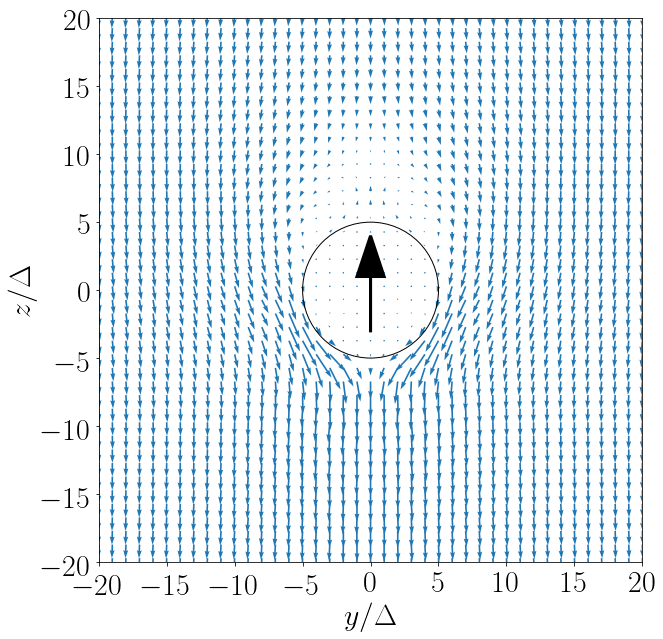

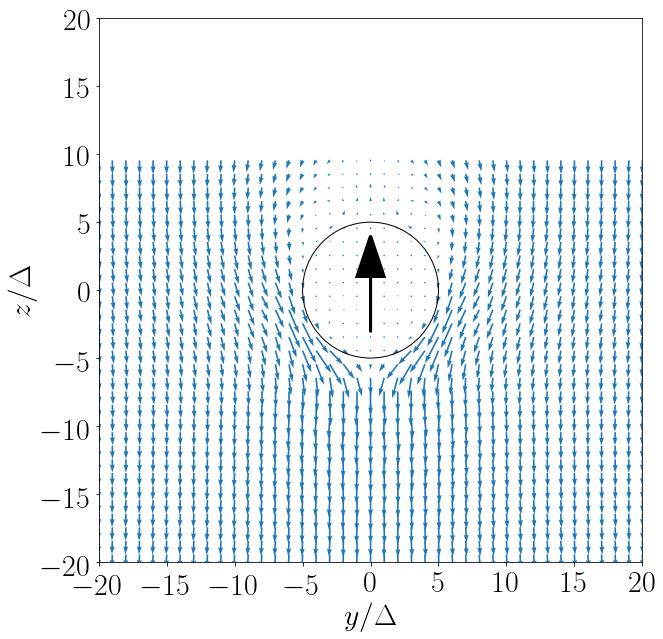

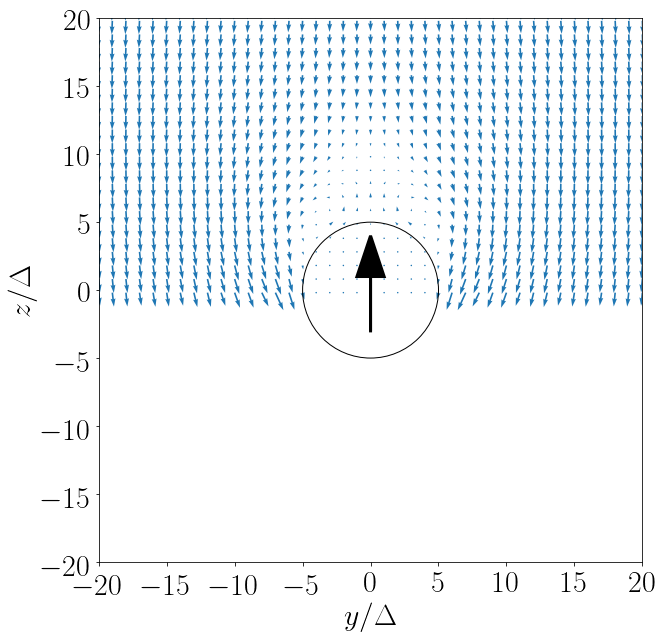

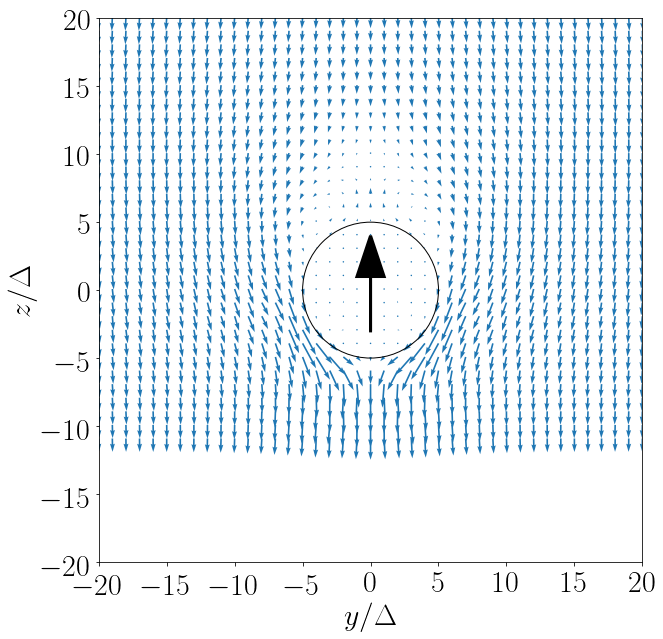

...

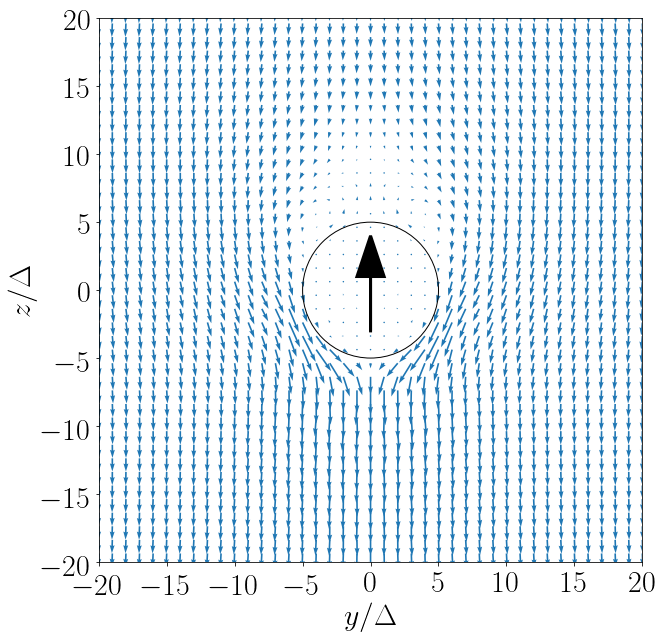

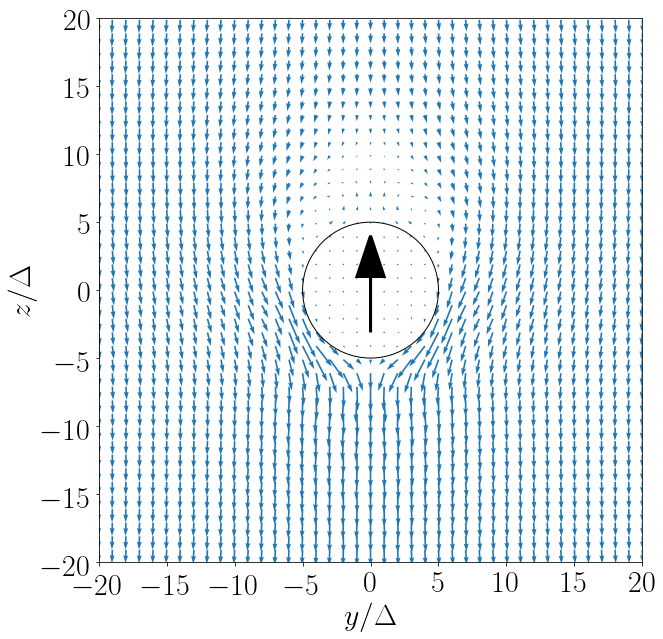

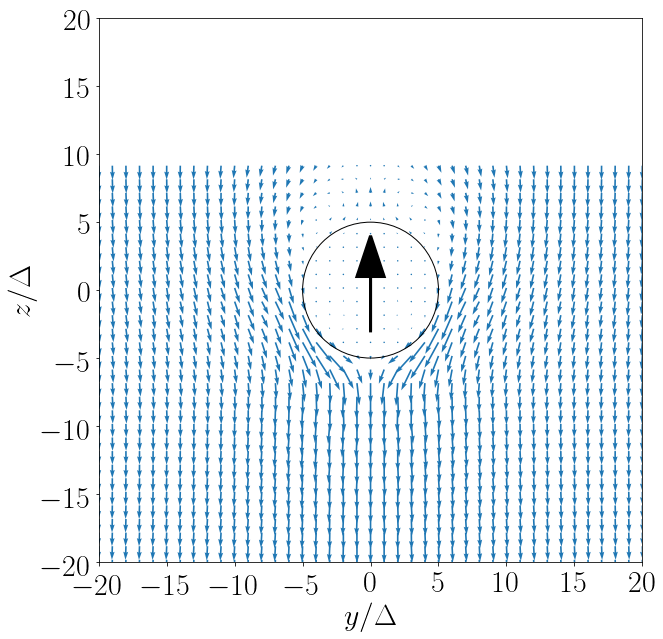

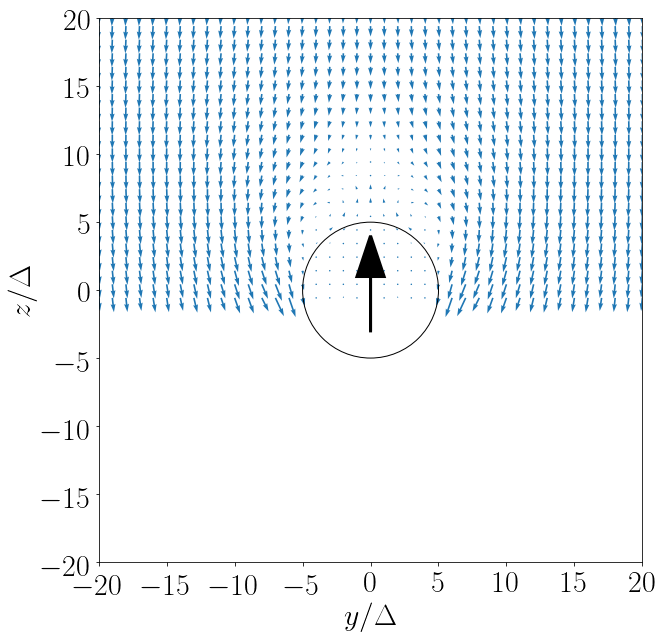

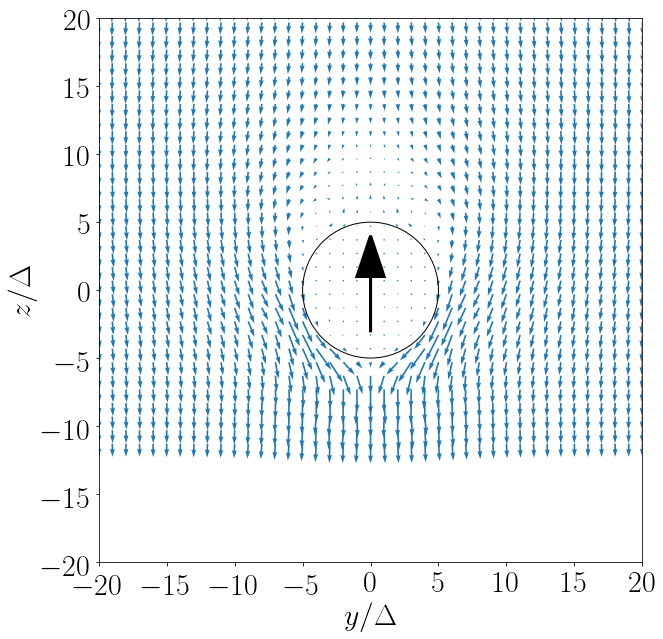

In [180]:
#Polar velocity field of the single squirmer:

n_frames=301

rf = "/Users/federico/mnt/ebi/kapsel3/B1_fixed_B2_C2/2neg_3/output/data.h5"
f = h5py.File(rf, 'r')

CM=np.zeros((n_frames,3))
V=np.zeros((n_frames,3))

Ly=64
Lz=64

dy=np.zeros((Ly,Lz))
dz=np.zeros((Ly,Lz))

for n in range (0,n_frames,30): 
    
    X=f['system_data/field/x'].value
    Y=f['system_data/field/y'].value
    Z=f['system_data/field/z'].value

    UX=f['trajectory_data/frame_'+str(n)+'/field/u_x'].value
    UY=f['trajectory_data/frame_'+str(n)+'/field/u_y'].value
    UZ=f['trajectory_data/frame_'+str(n)+'/field/u_z'].value
    
    CM[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    V[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    
   
    
    
    fig, ax = plt.subplots(figsize=(10,10))

    circle=patches.Circle((0.0,0.0),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)    
    

    #ax.quiver(X[:,32,:],Z[:,32,:],UX[:,32,:],UZ[:,32,:],scale=0.02,width=0.002,color='C0',angles='uv',label='simulation')
    #ax.quiver(X[:,:,12],Y[:,:,12],UX[:,:,12],UY[:,:,12],scale=0.02,width=0.002,color='C0',angles='uv',label='simulation')

    ax.quiver(Y[32,:,:]-CM[n,1],Z[32,:,:]-CM[n,2],UY[32,:,:],UZ[:,32,:]-V[n,2],scale=0.04,width=0.003,color='C0',angles='uv',label='simulation')

    plt.xlabel('$y/\Delta$',fontsize=30)
    plt.ylabel('$z/\Delta$',fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.xlim((-20,20))
    plt.ylim((-20,20))

    ax.set_aspect('equal')


    ax.add_patch(circle)
    
    
    #ax.arrow(int(CM[n,1]), int(CM[n,2])-3, 0.0, 4.0, linewidth=3.0, head_width=2.0, facecolor='black')
    ax.arrow(0.0, -3.0, 0.0, 4.0, linewidth=3.0, head_width=2.0, facecolor='black')
    
    #m = 20
    #y, z = np.mgrid[0:m, -m:m]
    #a=5.0
    #y_cm=0.0
    #z_cm=0.0
    #r=np.sqrt((y-y_cm)**2+(z-z_cm)**2)
    #B1=0.0015
    #C2=0.0
    #alpha_half=-2.0
    #cos_theta=(z-z_cm)/r
    #sin_theta=np.sqrt(1.0-cos_theta**2)
    #sin_2theta=2.0*sin_theta*cos_theta


    
    #uy= B1*(a**2/r**2)*((a/r)*sin_theta*cos_theta+alpha_half*(((a**2/r**2)-1.0)*(3.0*cos_theta**2-1.0)*sin_theta+(a**2/r**2)*sin_2theta*cos_theta))#+3.0*sin_2theta*C2*a**3/(2.0*r**3)
    #uz= B1*(a**2/r**2)*((a/r)*0.66-(a/r)*sin_theta**2+alpha_half*(((a**2/r**2)-1.0)*(3.0*cos_theta**2-1.0)*cos_theta-(a**2/r**2)*sin_2theta*sin_theta))-0.001


    #inner1 = r < a
    #uy[inner1] =0.0
    #uz[inner1] =0.0


    #y1, z1 = np.mgrid[-m:0, -m:m]
    #r1=np.sqrt((y1-y_cm)**2+(z1-z_cm)**2)
    #cos_theta1=(z1-z_cm)/r1
    #sin_theta1=np.sqrt(1.0-cos_theta1**2)
    #sin_2theta1=2.0*sin_theta1*cos_theta1


    
    #uy1= B1*(a**2/r1**2)*(-(a/r1)*sin_theta1*cos_theta1+alpha_half*(-((a**2/r1**2)-1.0)*(3.0*cos_theta1**2-1.0)*sin_theta1-(a**2/r1**2)*sin_2theta1*cos_theta1))#+3.0*sin_2theta*C2*a**3/(2.0*r**3)
    #uz1= B1*(a**2/r1**2)*((a/r1)*0.66-(a/r1)*sin_theta1**2+alpha_half*(((a**2/r1**2)-1.0)*(3.0*cos_theta1**2-1.0)*cos_theta1-(a**2/r1**2)*sin_2theta1*sin_theta1))-0.001

    #inner2 = r1 < a
    #uy1[inner2] =0.0
    #uz1[inner2] =0.0

    #ax.quiver(y, z, uy, uz, scale=0.04, width=0.003,color='red',label='theory')
    #ax.quiver(y1, z1, uy1, uz1, scale=0.04, width=0.003,color='red') #not label anymore because it would appear in the legend a third time

    #ax.legend(loc="upper right", shadow='True',fontsize='20')

    plt.show()
     
    fig.savefig('img_'+str(n)+'.png') 
    
    


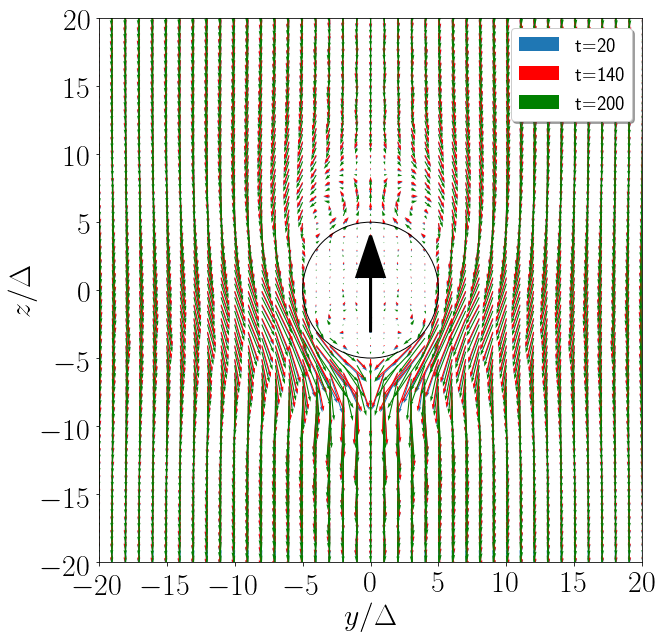

In [117]:
#Superposition of the polar velocity field at different times for puller, pusher and neutral.

rf = "/Users/federico/mnt/ebi/kapsel3/B1_fixed_B2_C2/2neg_3/output/data.h5"
f = h5py.File(rf, 'r')

CM_20=np.zeros((3))
V_20=np.zeros((3))
CM_140=np.zeros((3))
V_140=np.zeros((3))
CM_200=np.zeros((3))
V_200=np.zeros((3))
    
X=f['system_data/field/x'].value
Y=f['system_data/field/y'].value
Z=f['system_data/field/z'].value

UX_20=f['trajectory_data/frame_20/field/u_x'].value
UY_20=f['trajectory_data/frame_20/field/u_y'].value
UZ_20=f['trajectory_data/frame_20/field/u_z'].value
CM_20[:]=f['trajectory_data/frame_20/particle/pos'].value
V_20[:]=f['trajectory_data/frame_20/particle/vel'].value

UX_140=f['trajectory_data/frame_140/field/u_x'].value
UY_140=f['trajectory_data/frame_140/field/u_y'].value
UZ_140=f['trajectory_data/frame_140/field/u_z'].value
CM_140[:]=f['trajectory_data/frame_140/particle/pos'].value
V_140[:]=f['trajectory_data/frame_140/particle/vel'].value
    
UX_200=f['trajectory_data/frame_200/field/u_x'].value
UY_200=f['trajectory_data/frame_200/field/u_y'].value
UZ_200=f['trajectory_data/frame_200/field/u_z'].value
CM_200[:]=f['trajectory_data/frame_200/particle/pos'].value
V_200[:]=f['trajectory_data/frame_200/particle/vel'].value    
    
fig, ax = plt.subplots(figsize=(10,10))

circle=patches.Circle((0.0,0.0),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)    
    

plt.xlabel('$y/\Delta$',fontsize=30)
plt.ylabel('$z/\Delta$',fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlim((-20,20))
plt.ylim((-20,20))

ax.set_aspect('equal')


ax.add_patch(circle)
    
    
ax.arrow(0.0, -3.0, 0.0, 4.0, linewidth=3.0, head_width=2.0, facecolor='black')

ax.quiver(Y[32,:,:]-CM_20[1],Z[32,:,:]-CM_20[2],UY_20[32,:,:],UZ_20[32,:,:]-V_20[2],scale=0.02,width=0.002,color='C0',angles='uv',label='t=20')
ax.quiver(Y[32,:,:]-CM_140[1],Z[32,:,:]-CM_140[2],UY_140[32,:,:],UZ_140[32,:,:]-V_140[2],scale=0.02,width=0.002,color='red',angles='uv',label='t=140')
ax.quiver(Y[32,:,:]-CM_200[1],Z[32,:,:]-CM_200[2],UY_200[32,:,:],UZ_200[32,:,:]-V_200[2],scale=0.02,width=0.002,color='green',angles='uv',label='t=200')

ax.legend(loc="upper right",shadow='True',fontsize='20')

plt.show()

fig.savefig('pusher.pdf') 



# Azimuthal velocity field of the single squirmer:

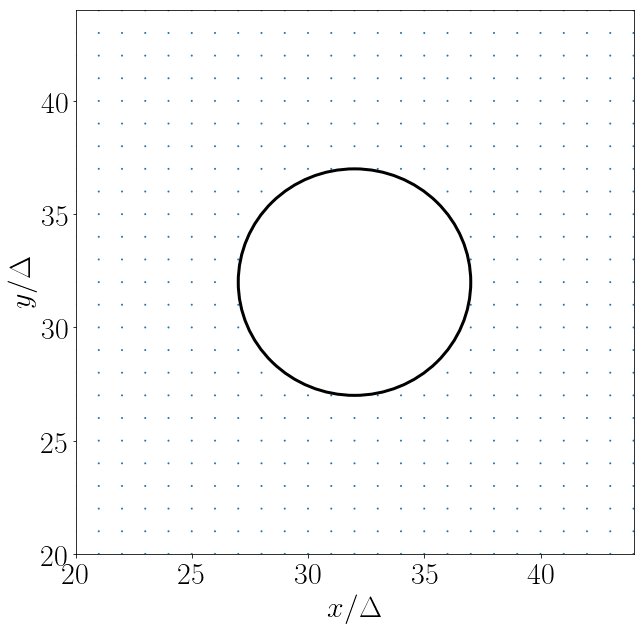

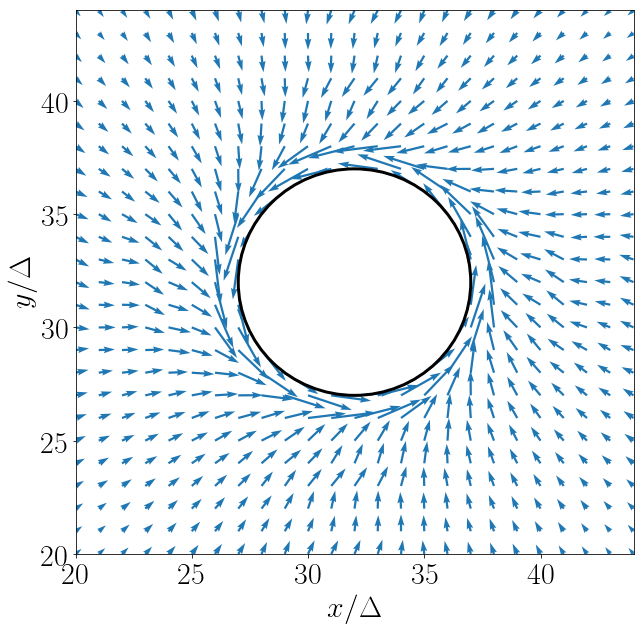

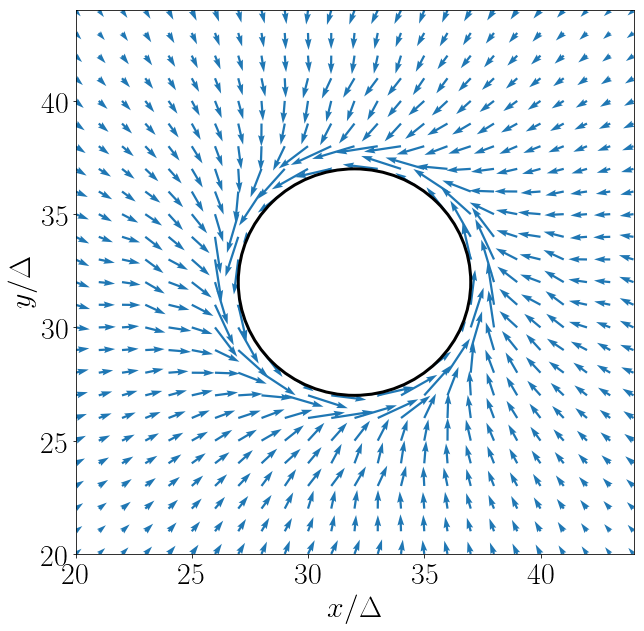

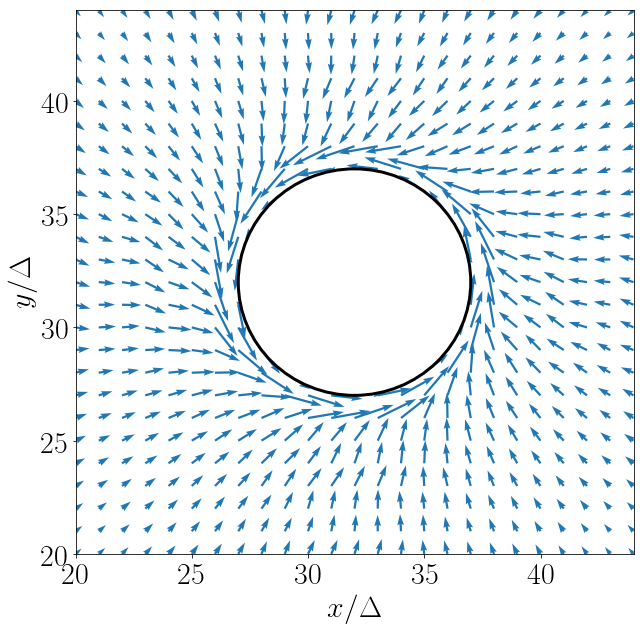

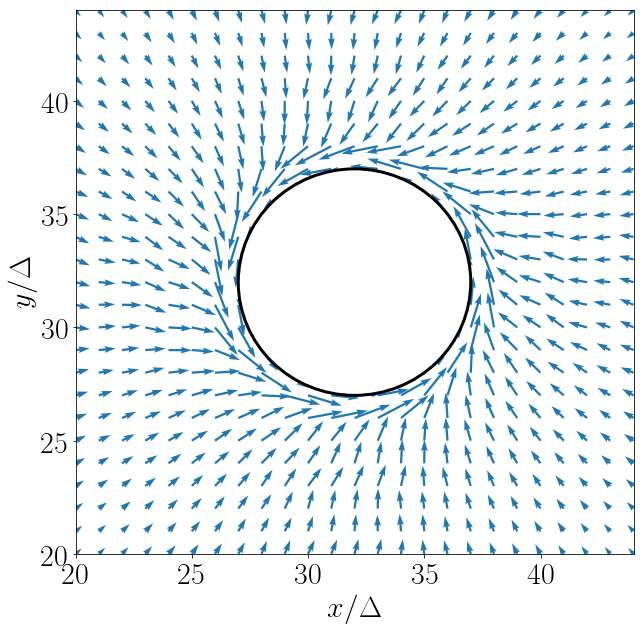

...

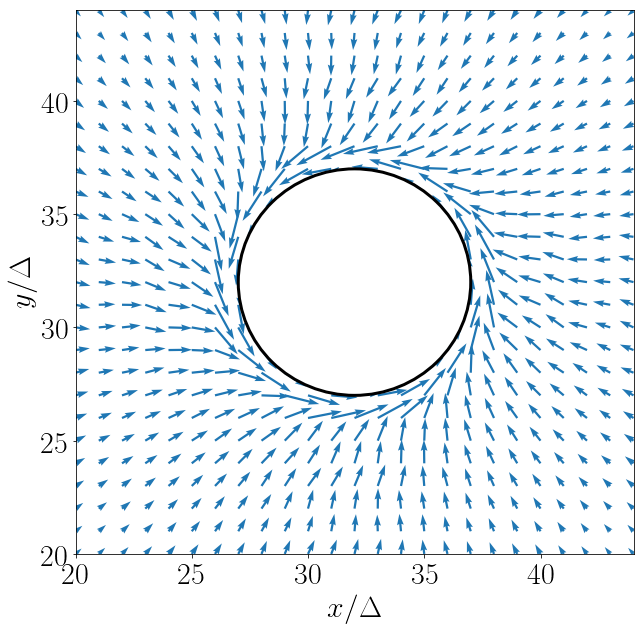

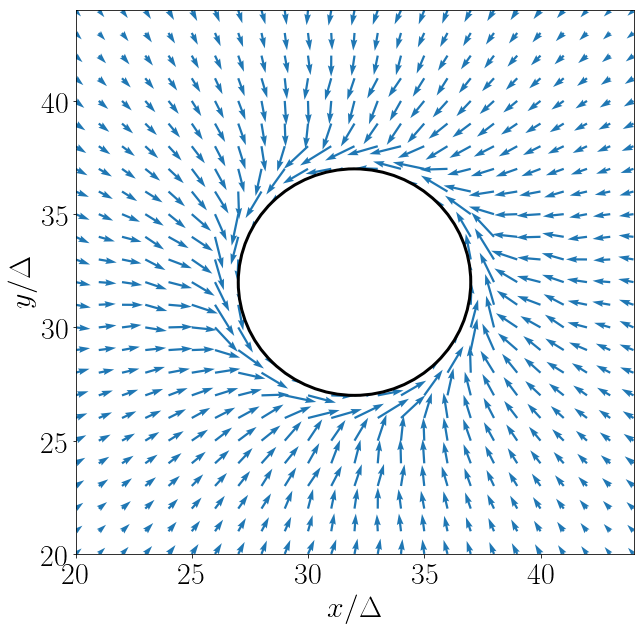

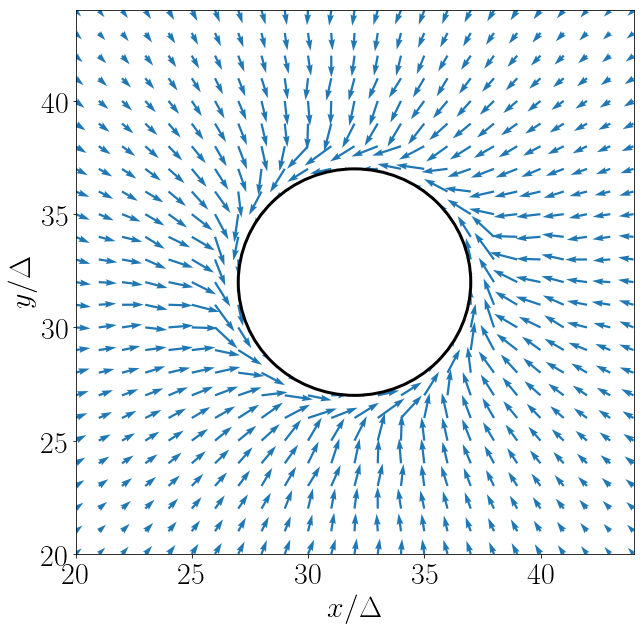

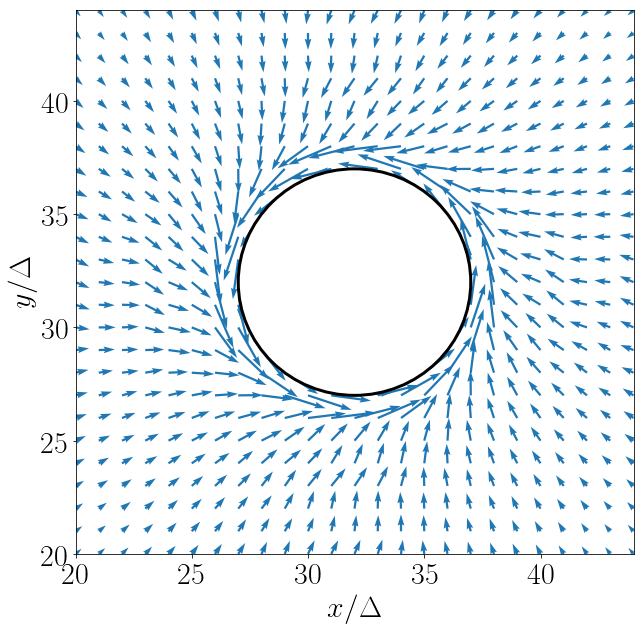

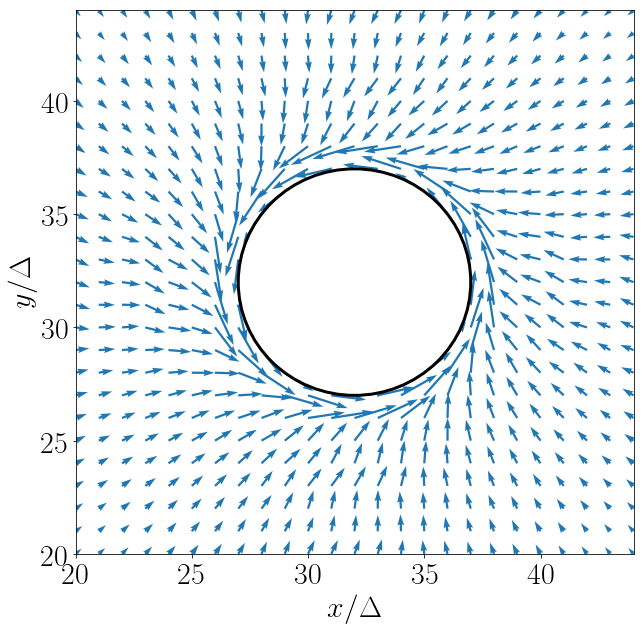

In [186]:
#Azimuthal velocity field of the single squirmer:


n_frames=301

rf = "/Users/federico/mnt/ebi/kapsel3/B1_fixed_B2_C2/2neg_3/output/data.h5"
f = h5py.File(rf, 'r')

CM=np.zeros((n_frames,3))

for n in range (0,n_frames,20): 
    
    X=f['system_data/field/x'].value
    Y=f['system_data/field/y'].value
    Z=f['system_data/field/z'].value
    UX=f['trajectory_data/frame_'+str(n)+'/field/u_x'].value
    UY=f['trajectory_data/frame_'+str(n)+'/field/u_y'].value
    UZ=f['trajectory_data/frame_'+str(n)+'/field/u_z'].value
    
    U=np.sqrt(UX**2+UY**2+UZ**2)
    
    CM[n,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    
    fig, ax = plt.subplots(figsize=(10,10))

    circle=patches.Circle((CM[n,0],CM[n,1]),5,facecolor='White',edgecolor='black',linewidth=3,zorder=10)

    ax.quiver(X[:,:,(int(CM[n,2])+2)],Y[:,:,(int(CM[n,2])+2)],UX[:,:,(int(CM[n,2])+2)],UY[:,:,(int(CM[n,2])+2)],scale=0.009, width=0.004,color='C0',angles='uv',label='simulation')
    plt.xlabel('$x/\Delta$',fontsize=30)
    plt.ylabel('$y/\Delta$',fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.xlim((20,44))
    plt.ylim((20,44))


    ax.add_patch(circle)

######Comparison simulation vs theory:
    #m = 64
    #x, y = np.mgrid[0:m, 0:m]
    #x, y = np.mgrid[20:44, 20:44]
    #a=5.0
    #x_cm=CM[n,0]
    #y_cm=CM[n,1]
    #r=np.sqrt((x-x_cm)**2+(y-y_cm)**2)
    #C2=0.0015
    #theta=np.pi*0.25*3.0
    #theta=np.pi-np.arctan2((abs(y-CM[n,1])),2.0)
    #phi=np.arctan2((y-y_cm),(x-x_cm))
                
    #ux = -3.0*np.sin(2.0*theta)*C2*a**3*np.sin(phi)/(2.0*r**3)
    #uy = 3.0*np.sin(2.0*theta)*C2*a**3*np.cos(phi)/(2.0*r**3)
    #inner = r < a
    #ux[inner] = 0.0 
    #uy[inner] = 0.0 

    #ax.quiver(x, y, ux, uy, scale=0.009, width=0.004,color='red', label='theory')

    #ax.legend(loc="upper right",shadow='True',fontsize='20')

    plt.show()
    
    
    fig.savefig('img_down_'+str(n)+'.png') 
    


  

    

# Two interacting squirmers

## Two squirmers analysis -- velocities and centres of masses

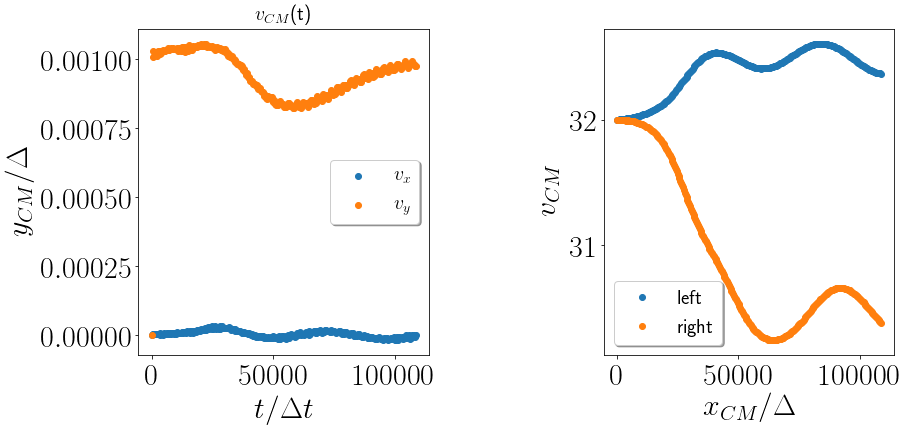

In [122]:
# Plotting the velocity of the two squirmers and their positions:

n_frames=301

rf = "/Users/federico/mnt/ebi/kapsel3/ANG_SCATT/-2/C2_same/60/output/data.h5"
f = h5py.File(rf, 'r')

fig,  (ex,fx) = plt.subplots(1,2,figsize=(15,6))
fig.subplots_adjust(left=0.2, wspace=0.6)


ex.set_xlabel('$t/\Delta t$',fontsize=20)
ex.set_ylabel('$v_{CM}$',fontsize=20)
ex.tick_params(axis='both',labelsize=20)
ex.set_title('$v_{CM}$(t)',size=20)
#ex.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

TIME=np.zeros(n_frames)
V=np.zeros(((n_frames,2,3)))
VTOT=np.zeros((n_frames,3))
CM=np.zeros(((n_frames,2,3)))
FORCE=np.zeros((n_frames,2,3))

for n in range (0,n_frames):
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    V[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    FORCE[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/force_h'].value
    CM[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    VTOT[n,0]=np.sqrt(V[n,0,0]**2+V[n,0,1]**2+V[n,0,2]**2)
    VTOT[n,1]=np.sqrt(V[n,1,0]**2+V[n,1,1]**2+V[n,1,2]**2)

    
ex.set_xlabel('$t/\Delta t$',fontsize=30)
#fx.set_ylabel('$(z_{1}-z_{2})/\Delta$',fontsize=20)
ex.set_ylabel('$y_{CM}/\Delta$',fontsize=30)
ex.tick_params(axis='both',labelsize=30)
#fx.set_title('CM(t)',size=20)
#fx.set_title('F(t)',size=20)
#plt.ylim((12,16))
#fx.ticklabel_format(style='sci', axis='x', scilimits=(0,0))    
    

ex.plot(TIME,V[:,0,0],'o')
ex.plot(TIME,V[:,0,1],'o')
#ex.plot(TIME,V[:,0,2],'o')
#ex.plot(TIME,VTOT[:,0],'o')
#ex.plot(TIME,VTOT[:,1],'o')
ex.legend(["$v_{x}$","$v_{y}$","$v_{z}$"], shadow='True', fontsize='20')


###########################################


fx.set_xlabel('$x_{CM}/\Delta$',fontsize=30)
#fx.set_ylabel('$(z_{1}-z_{2})/\Delta$',fontsize=20)
fx.set_ylabel('$v_{CM}$',fontsize=30)
fx.tick_params(axis='both',labelsize=30)
#fx.set_title('CM(t)',size=20)
#fx.set_title('F(t)',size=20)
#plt.ylim((12,16))
#fx.ticklabel_format(style='sci', axis='x', scilimits=(0,0))



   

#fx.plot(CM[:,0,0],CM[:,0,1],label='left',linewidth='3')
#fx.plot(CM[:,1,0],CM[:,1,1],label='right',linewidth='3')

fx.plot(TIME,CM[:,0,0],'o')
fx.plot(TIME,CM[:,1,0],'o')

#fx.plot(TIME,CM[:,1:0])


#fx.plot(TIME,abs(CM[:,0,1]-CM[:,1,1]),'o')
#plt.legend(["bottom squirm.","upper squirm."])

plt.legend(["left","right"],shadow='True',fontsize='20')


#ex.grid(color='w', linestyle='-',linewidth='2')
#fx.grid(color='w', linestyle='-',linewidth='2')

#ex.patch.set_facecolor('0.8')
#fx.patch.set_facecolor('0.8')

plt.show()

#fig.savefig('a.png')

#med=np.average(FORCE[:,0,0],axis=0)
#print(med)



# Two squirmers analysis -- polar velocity field

/Users/federico/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


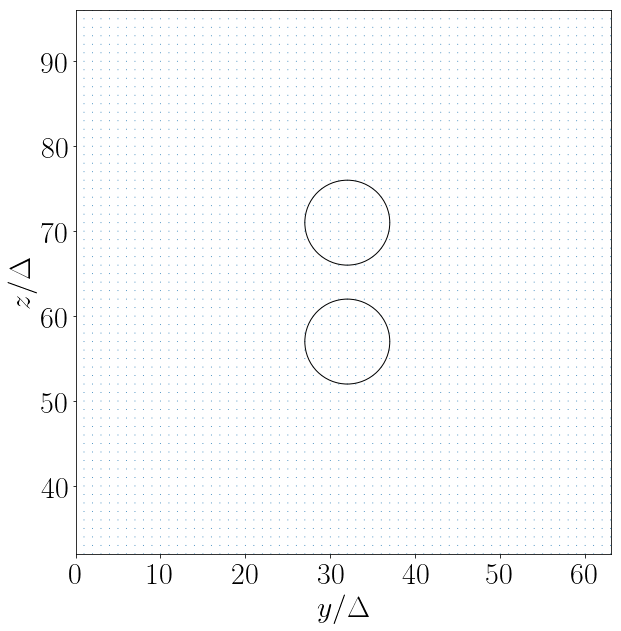

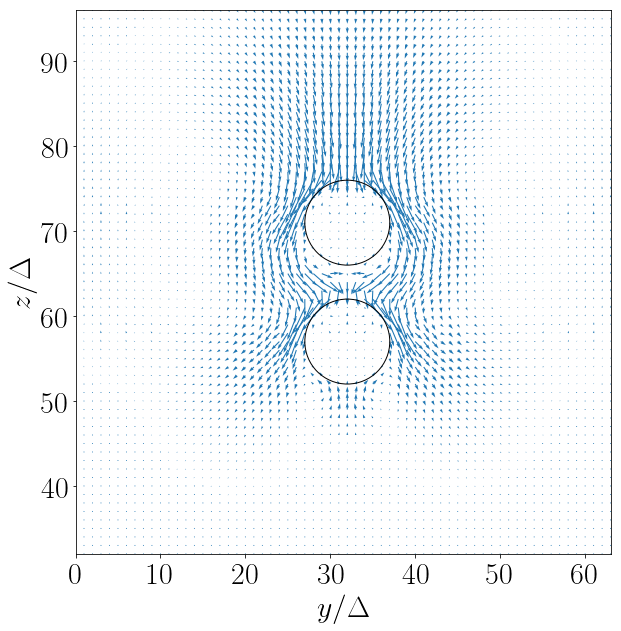

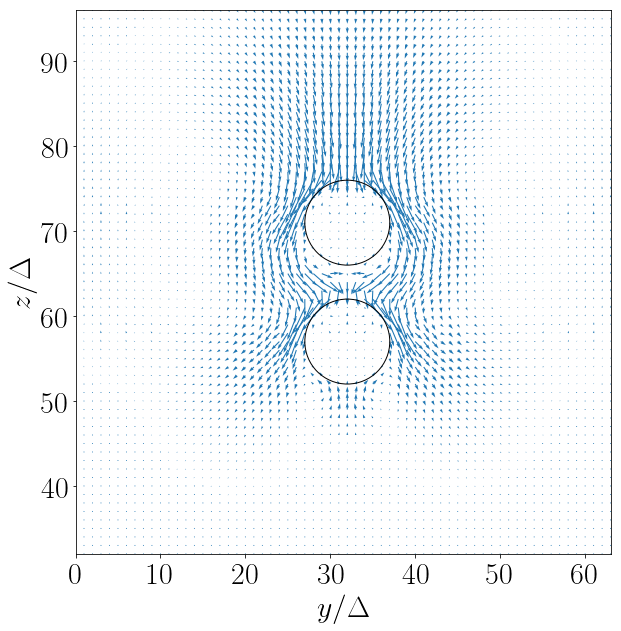

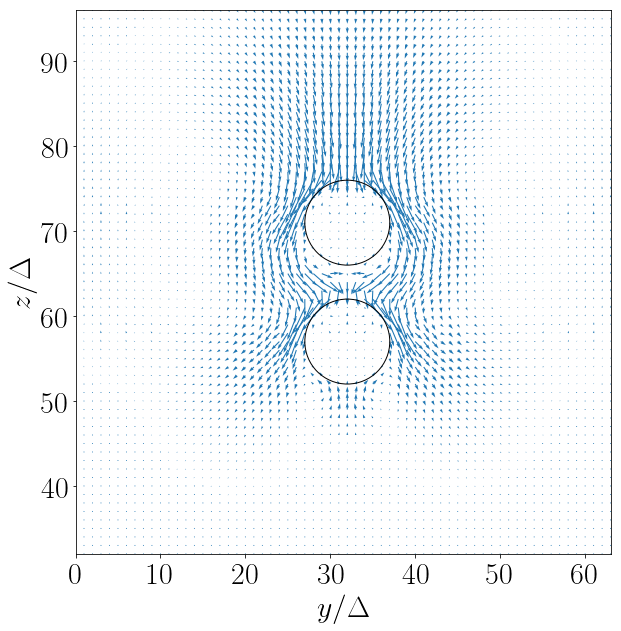

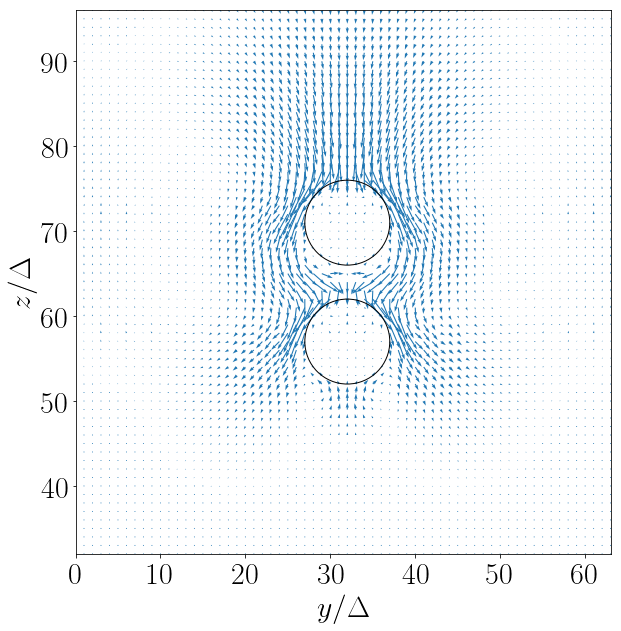

...

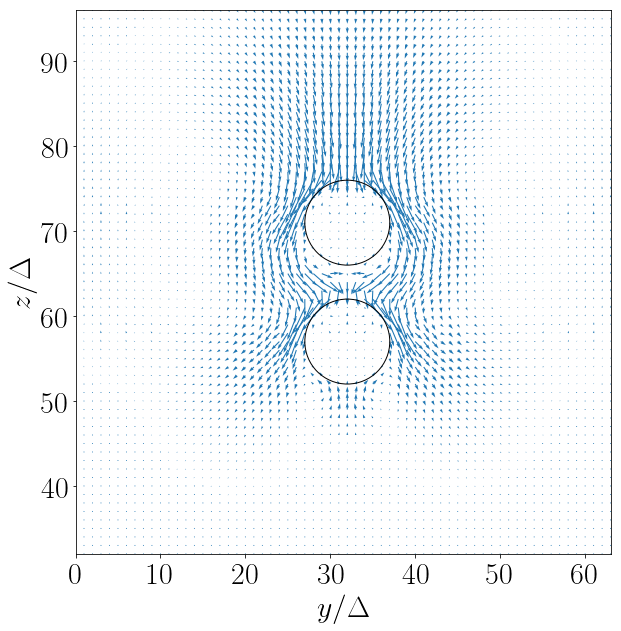

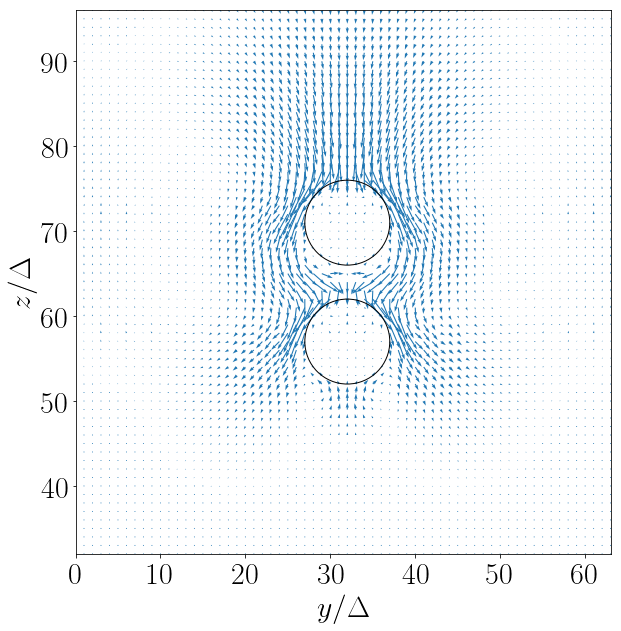

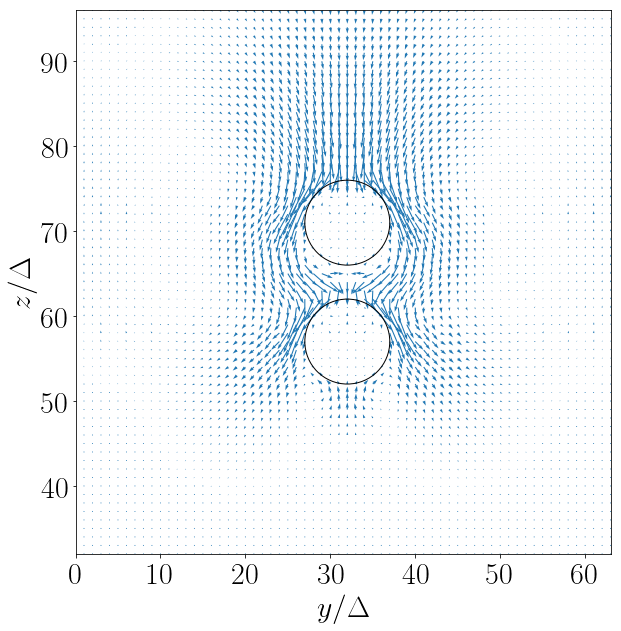

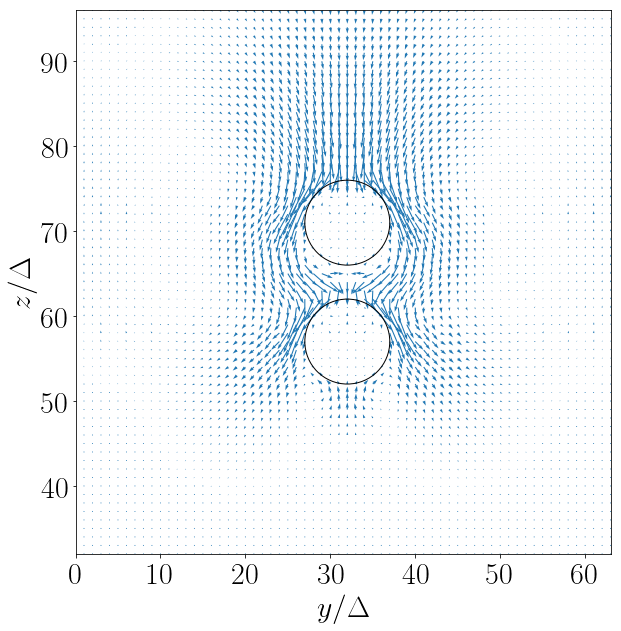

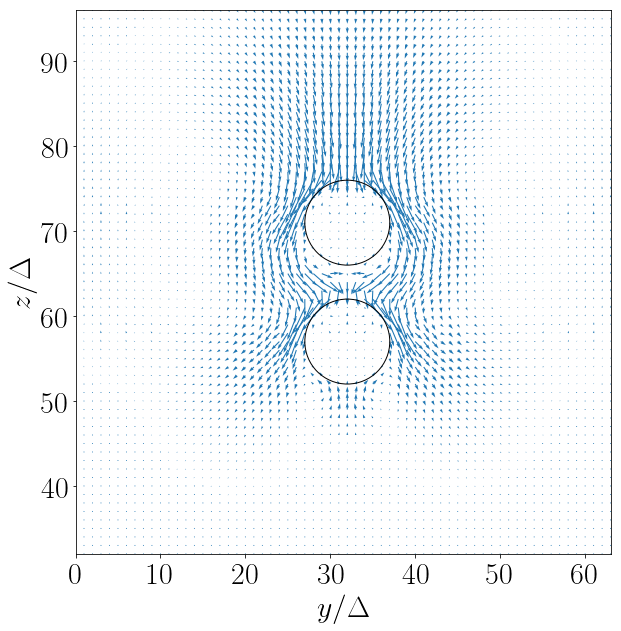

In [123]:
#### Plot uy and uz for two squimers:

n_frames=301

rf = "/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE_2/2/14/output/data.h5"
f = h5py.File(rf, 'r')

CM=np.zeros(((n_frames,2,3)))
V=np.zeros(((n_frames,2,3)))
VTOT=np.zeros((n_frames,3))

for n in range (0,n_frames,10): 
    
    



    X=f['system_data/field/x'].value
    Y=f['system_data/field/y'].value
    Z=f['system_data/field/z'].value




    PHI=f['trajectory_data/frame_'+str(n)+'/field/phi'].value
    UX=f['trajectory_data/frame_'+str(n)+'/field/u_x'].value
    UY=f['trajectory_data/frame_'+str(n)+'/field/u_y'].value
    UZ=f['trajectory_data/frame_'+str(n)+'/field/u_z'].value

#PHI=f['trajectory_data/frame_100/field/phi'].value
#UX=f['trajectory_data/frame_100/field/u_x'].value
#UY=f['trajectory_data/frame_100/field/u_y'].value
#UZ=f['trajectory_data/frame_100/field/u_z'].value
    
    CM[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    V[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
  
    
    fig, ax = plt.subplots(figsize=(10,10))
    
    VTOT[n,0]=np.sqrt(V[n,0,0]**2+V[n,0,1]**2+V[n,0,2]**2)

    circle=patches.Circle((CM[n,0,1],CM[n,0,2]),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)
    circle1=patches.Circle((CM[n,1,1],CM[n,1,2]),5,facecolor='None',edgecolor='black',linewidth=1,zorder=10)

#strm=ax.streamplot(X[:,0,31],Y[0,:,31],UX[:,:,31],UY[:,:,31],arrowstyle='->',color='C0',linewidth=1,arrowsize=2.0,density=4,zorder=1)
    ax.quiver(Y[int(CM[n,1,0]),:,:],Z[int(CM[n,1,0]),:,:],UY[int(CM[n,1,0]),:,:],UZ[int(CM[n,1,0]),:,:],scale=0.03,width=0.002,color='C0',angles='uv',label='simulation')
#ax.pcolormesh(X[:,:,33],Y[:,:,33],UY[:,:,33])
    plt.xlabel('$y/\Delta$',fontsize=30)
    plt.ylabel('$z/\Delta$',fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.xlim((0,63))
    plt.ylim((32,96))

    ax.set_aspect('equal')
    
    ax.add_patch(circle)
    ax.add_patch(circle1)
    
    #ax.arrow(int(CM[n,0,1]), int(CM[n,0,2])-3, 0.0, 4.0, linewidth=3.0, head_width=2.0, facecolor='black')
    #ax.arrow(int(CM[n,1,1]), int(CM[n,1,2])-3, 0.0, 4.0, linewidth=3.0, head_width=2.0, facecolor='black')
    
    #ax.arrow(-7, -3, 0, 4, linewidth=3.0, head_width=2.0, facecolor='black')
    #ax.arrow(7, -3, 0, 4, linewidth=3.0, head_width=2.0, facecolor='black')

    fig.savefig('img_'+str(n)+'.png') 
    

    


## Two squirmers analysis -- azimuthal velocity field

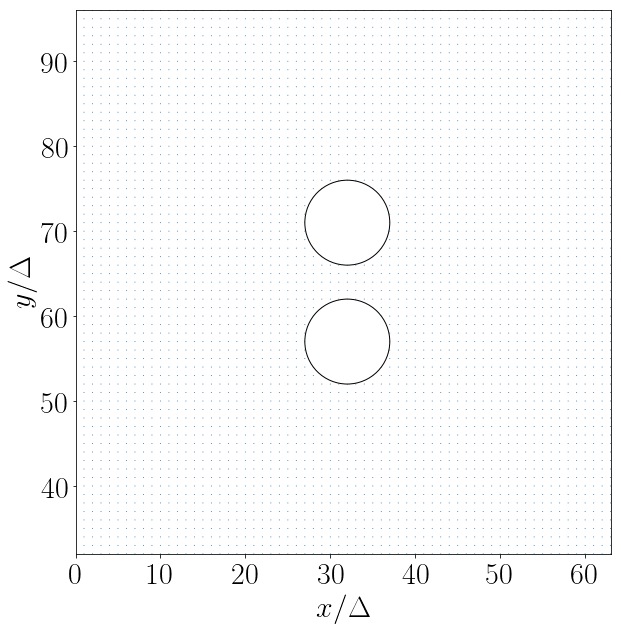

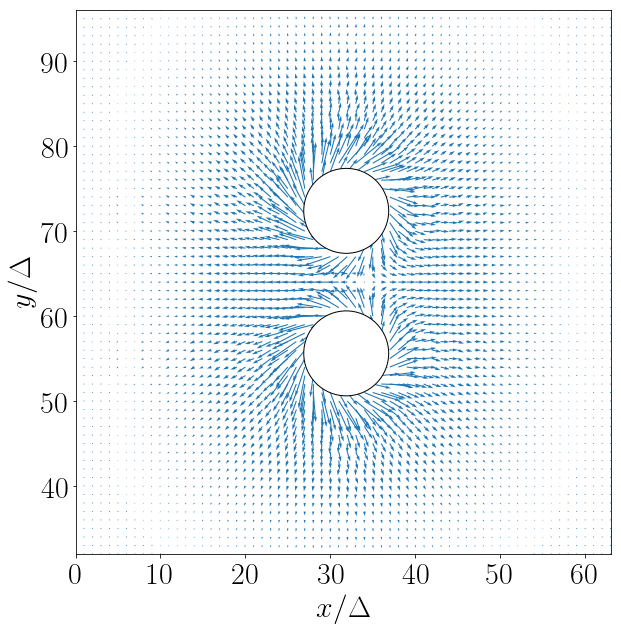

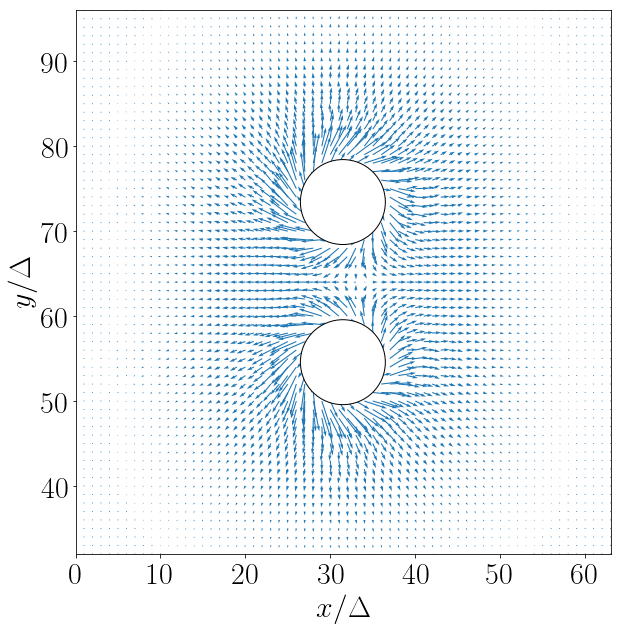

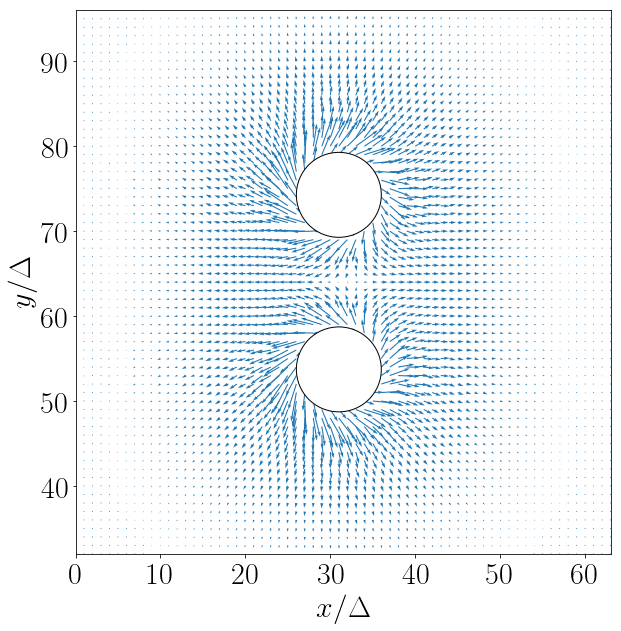

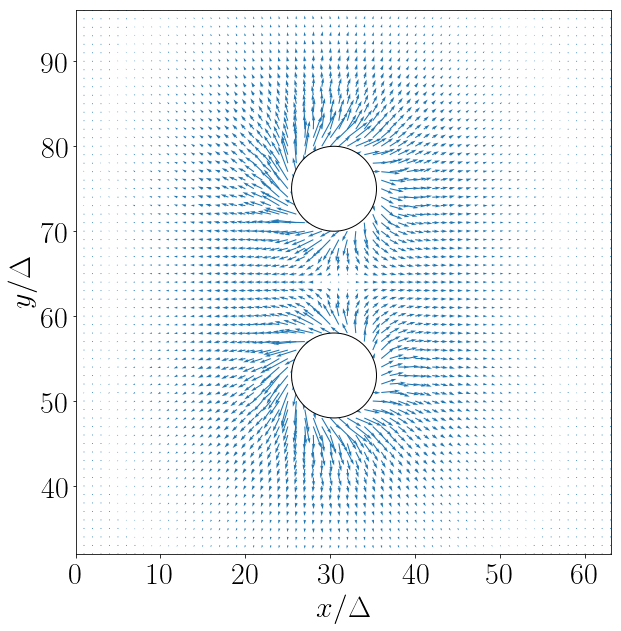

...

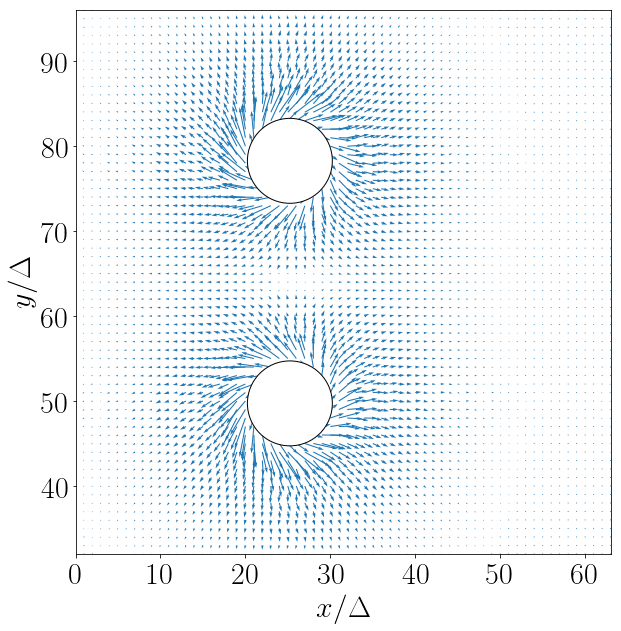

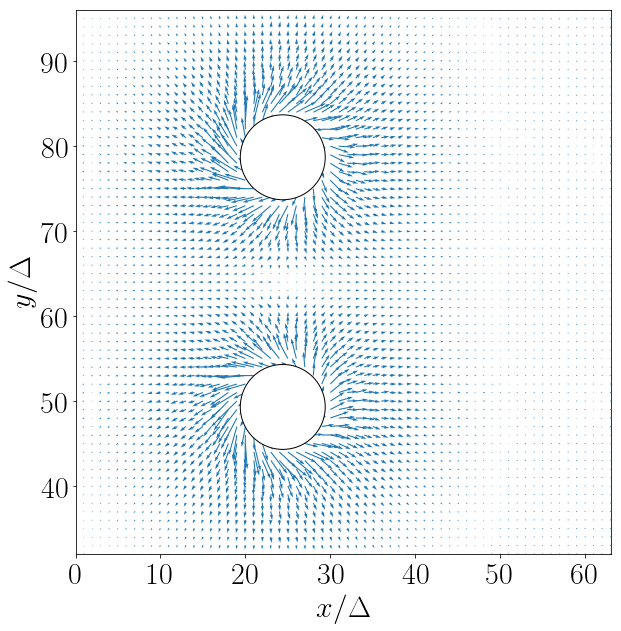

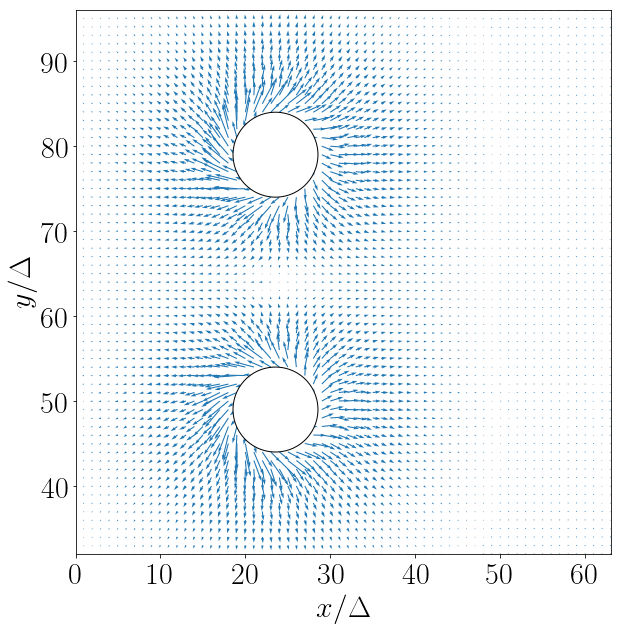

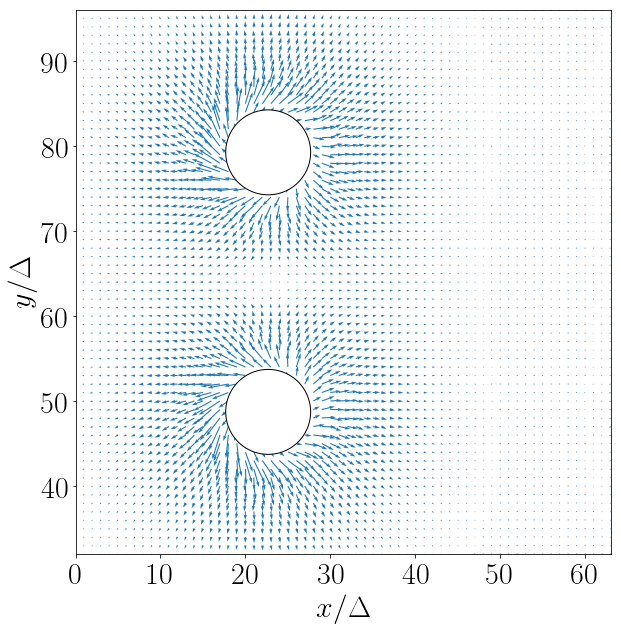

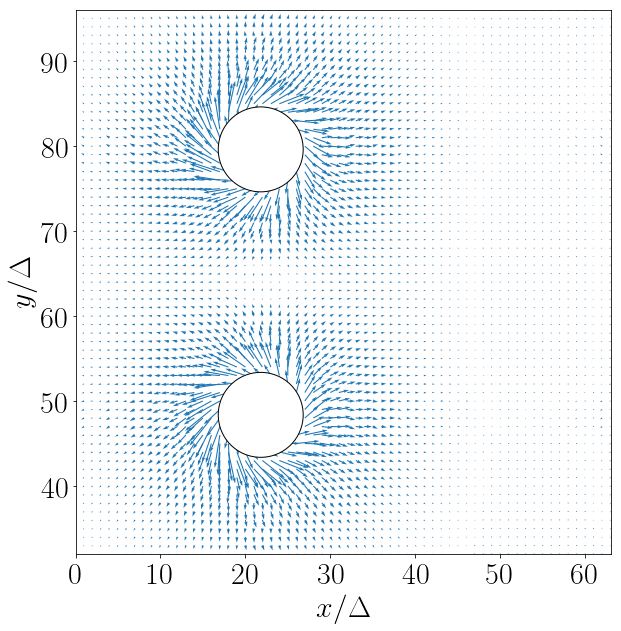

In [124]:
n_frames=301

rf = "/Users/federico/mnt/ebi/kapsel3/2_squirmers_interaction/2/14/output/data.h5"
f = h5py.File(rf, 'r')

CM=np.zeros(((n_frames,2,3)))

for n in range (0,n_frames,20): 
    
    



    X=f['system_data/field/x'].value
    Y=f['system_data/field/y'].value
    Z=f['system_data/field/z'].value




    PHI=f['trajectory_data/frame_'+str(n)+'/field/phi'].value
    UX=f['trajectory_data/frame_'+str(n)+'/field/u_x'].value
    UY=f['trajectory_data/frame_'+str(n)+'/field/u_y'].value
    UZ=f['trajectory_data/frame_'+str(n)+'/field/u_z'].value

#PHI=f['trajectory_data/frame_100/field/phi'].value
#UX=f['trajectory_data/frame_100/field/u_x'].value
#UY=f['trajectory_data/frame_100/field/u_y'].value
#UZ=f['trajectory_data/frame_100/field/u_z'].value
    
    CM[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    fig, ax = plt.subplots(figsize=(10,10))

    circle=patches.Circle((CM[n,0,0],CM[n,0,1]),5,facecolor='White',edgecolor='black',linewidth=1,zorder=10)   
    circle1=patches.Circle((CM[n,1,0],CM[n,1,1]),5,facecolor='White',edgecolor='black',linewidth=1,zorder=10)

#strm=ax.streamplot(X[:,0,31],Y[0,:,31],UX[:,:,31],UY[:,:,31],arrowstyle='->',color='C0',linewidth=1,arrowsize=2.0,density=4,zorder=1)
    ax.quiver(X[:,:,int(CM[n,1,2])+2],Y[:,:,int(CM[n,1,2])+2],UX[:,:,int(CM[n,1,2])+2],UY[:,:,int(CM[n,1,2])+2],scale=0.02, width=0.002,color='C0',angles='uv',label='simulation')
#ax.pcolormesh(X[:,:,33],Y[:,:,33],UY[:,:,33])
    plt.xlabel('$x/\Delta$',fontsize=30)
    plt.ylabel('$y/\Delta$',fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.xlim((0,63))
    plt.ylim((32,96))
    
    ax.set_aspect('equal')


    ax.add_patch(circle)
    ax.add_patch(circle1)
    
    #ax.arrow(25, 64, -3, 0, linewidth=3.0, head_width=2.0, facecolor='black')
    
    fig.savefig('img_'+str(n)+'.png') 
    
    

## Two squirmers analysis -- force of interaction

opposite $C_{2}$

In [788]:
dirs1   = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/*")))
ignore1 = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/*_*")))
dirs1 = natsorted(dirs1-ignore1)
print(dirs1)


dirs2   = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/2/*")))
ignore2 = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/2/*_*")))
dirs2 = natsorted(dirs2-ignore2)
print(dirs2)

dirs3   = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/0/*")))
ignore3 = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/0/*_*")))
dirs3 = natsorted(dirs3-ignore3)
print(dirs3)

['/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/10', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/12', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/14', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/16', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/18', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/20', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/22', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/24', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/26', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/28', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/30', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/34', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/40', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/44', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/50']
['/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/2/10', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/2/12

In [789]:
def analyze_function(path):
    file = path+'/output/data.h5'
    with h5py.File(file) as fp:
        keys  = ['trajectory_data/' + key for key in natsorted(fp['trajectory_data'].keys())]
        shape = fp[keys[0]+"/particle/force_h"].value.shape
        FORCE_HYDRO=np.zeros((len(keys),)+shape)
        for i in range(len(keys)):
            FORCE_HYDRO[i,:,:]=fp[keys[i]+'/particle/force_h'].value
    return FORCE_HYDRO

In [790]:
forces1 = np.array([analyze_function(loc) for loc in dirs1])
forces1.shape

(15, 301, 2, 3)

In [791]:
forces2 = np.array([analyze_function(loc) for loc in dirs2])
forces2.shape

(15, 301, 2, 3)

In [792]:
forces3 = np.array([analyze_function(loc) for loc in dirs3])
forces3.shape

(15, 301, 2, 3)

In [793]:
force_av_pushers=np.zeros(((15,2,3)))
force_av_pullers=np.zeros(((15,2,3)))
force_av_neutrals=np.zeros(((15,2,3)))

force_av_pushers[:,:,:]=np.average(forces1[:,:,:,:],axis=1)
force_av_pullers[:,:,:]=np.average(forces2[:,:,:,:],axis=1)
force_av_neutrals[:,:,:]=np.average(forces3[:,:,:,:],axis=1)

force_av_pushers.shape
force_av_pullers.shape
force_av_neutrals.shape

#for n in range (0,301):
    #force_av[:,:,:] += forces[:,n,:,:]
#force_av[:,:,:]=np.asarray(force_av[:,:,:])/301

#force_av.shape

(15, 2, 3)

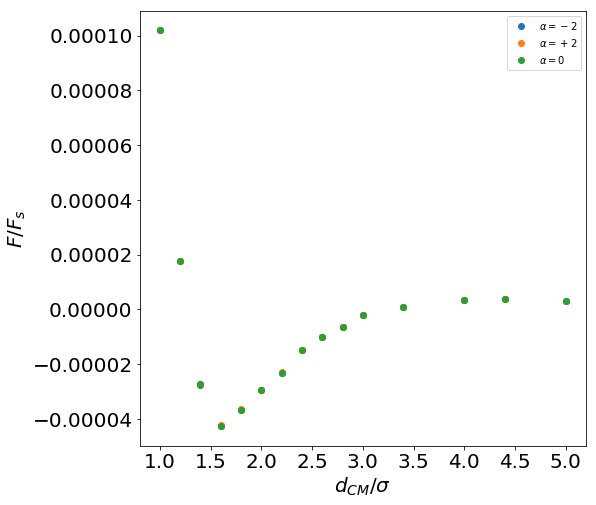

In [795]:
a=5.0
sigma=2.0*a
eta=1.0
B1=0.0015
alpha=-2.0
Fs=6.0*np.pi*eta*a*0.66*B1    # Stokes law for drag force of a spherical particle in a fluid

dist1=[10.0,12.0,14.0,16.0,18.0,20.0,22.0,24.0,26.0,28.0,30.0,34.0,40.0,44.0,50.0]
dist=np.asarray(dist1)/sigma


plt.figure(figsize=(8, 8))
plt.xlabel('$d_{CM}/\sigma$',fontsize=20)
plt.ylabel('$F/F_{s}$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.plot(dist,np.asarray(force_av_pushers[:,0,0]/Fs),'o')
plt.plot(dist,np.asarray(force_av_pullers[:,0,0]/Fs),'o')
plt.plot(dist,np.asarray(force_av_neutrals[:,0,0]/Fs),'o')

#plt.plot(dist,np.asarray(abs(force_av_pushers[:,1,2]/Fs)),'o')
#plt.plot(dist,np.asarray(abs(force_av_pullers[:,1,2]/Fs)),'o')
#plt.plot(dist,np.asarray(abs(force_av_neutrals[:,1,2]/Fs)),'o')



#force_theor=(0.10*alpha+0.02)*(np.log(np.asarray(dist)/sigma-1.0)+0.2) #dal Gompper
#force_theor=-0.327*np.log(np.asarray(dist)/sigma-1.0) #da John

#force_far=((3.0*np.pi*sigma**3*alpha*B1)/(16.0*np.asarray(dist1)**2))/Fs

#plt.plot(dist,force_far)

#def func(x,a,b,c):
    #return a*np.log((x-b)/c)

#popt, pcov = curve_fit(func, dist, force_av_pushers[:,1,1])

#plt.plot(dist,func(dist,*popt))

#print(popt)

plt.legend([r"$\alpha=-2$",r"$\alpha=+2$", r"$\alpha=0$"],shadow='True',fontsize='20')

#plt.legend([r"$squirmer-down$",r"$squirmer-up$"])


#plt.savefig('FORCE_opposite_C2_z_0_1_neutral.png')  


same $C_{2}$

In [781]:
dirs4   = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/*_*")))
ignore4= set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/*_C2_*")))
dirs4 = natsorted(dirs4-ignore4)
print(dirs4)

dirs5   = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/2/*_*")))
ignore5= set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/2/*_C2_*")))
dirs5 = natsorted(dirs5-ignore5)
print(dirs5)

dirs6   = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/0/*_*")))
ignore6= set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/0/*_C2_*")))
dirs6 = natsorted(dirs6-ignore6)
print(dirs6)

['/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/10_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/12_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/14_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/16_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/18_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/20_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/22_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/24_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/26_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/28_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/30_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/34_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/40_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/44_2', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/50_2']
['/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/2/10_2', '/Users/federico/mnt/eb

In [782]:
def analyze_function(path):
    file = path+'/output/data.h5'
    with h5py.File(file) as fp:
        keys  = ['trajectory_data/' + key for key in natsorted(fp['trajectory_data'].keys())]
        shape = fp[keys[0]+"/particle/force_h"].value.shape
        FORCE_HYDRO=np.zeros((len(keys),)+shape)
        for i in range(len(keys)):
            FORCE_HYDRO[i,:,:]=fp[keys[i]+'/particle/force_h'].value
    return FORCE_HYDRO

In [783]:
forces4 = np.array([analyze_function(loc) for loc in dirs4])
forces4.shape

(15, 301, 2, 3)

In [784]:
forces5 = np.array([analyze_function(loc) for loc in dirs5])
forces5.shape

(15, 301, 2, 3)

In [785]:
forces6 = np.array([analyze_function(loc) for loc in dirs6])
forces6.shape

(15, 301, 2, 3)

In [786]:
force_av_pushers_2=np.zeros(((15,2,3)))
force_av_pullers_2=np.zeros(((15,2,3)))
force_av_neutrals_2=np.zeros(((15,2,3)))

force_av_pushers_2[:,:,:]=np.average(forces4[:,:,:,:],axis=1)
force_av_pullers_2[:,:,:]=np.average(forces5[:,:,:,:],axis=1)
force_av_neutrals_2[:,:,:]=np.average(forces6[:,:,:,:],axis=1)

force_av_pushers_2.shape
force_av_pullers_2.shape
force_av_neutrals_2.shape

(15, 2, 3)

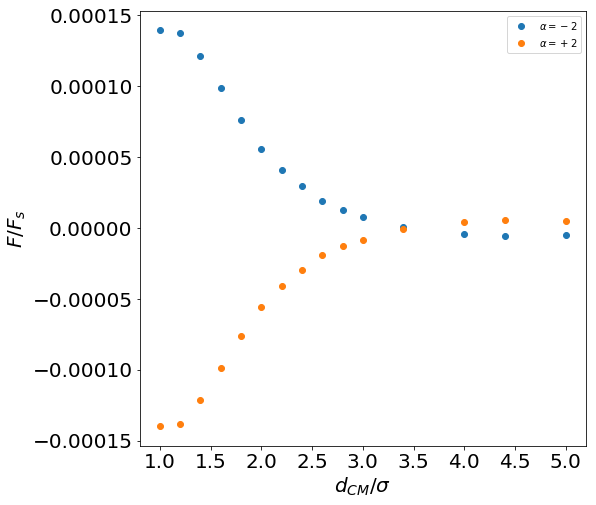

In [787]:
a=5.0
sigma=2.0*a
eta=1.0
B1=0.0015
alpha=-2.0
Fs=6.0*np.pi*eta*a*0.66*B1    # Stokes law for drag force of a spherical particle in a fluid

dist1=[10.0,12.0,14.0,16.0,18.0,20.0,22.0,24.0,26.0,28.0,30.0,34.0,40.0,44.0,50.0]
dist=np.asarray(dist1)/sigma


plt.figure(figsize=(8, 8))
plt.xlabel('$d_{CM}/\sigma$',fontsize=20)
plt.ylabel('$F/F_{s}$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.plot(dist,np.asarray(force_av_pushers_2[:,0,0]/Fs),'o')
#plt.plot(dist,np.asarray(force_av_pullers_2[:,0,0]/Fs),'o')
#plt.plot(dist,np.asarray(force_av_neutrals_2[:,0,0]/Fs),'o')

plt.plot(dist,np.asarray(force_av_pushers_2[:,1,0]/Fs),'o')
#plt.plot(dist,np.asarray(force_av_pullers_2[:,1,0]/Fs),'o')
#plt.plot(dist,np.asarray(force_av_neutrals_2[:,1,0]/Fs),'o')


plt.legend([r"$\alpha=-2$",r"$\alpha=+2$", r"$\alpha=0$"],shadow='True',fontsize='20')

plt.savefig('FORCE_2_same_C2_pushers_0_1_x.png')  


$C_{2}=0$

In [611]:
dirs7   = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/*_C2*")))
dirs7 = natsorted(dirs7)
print(dirs7)

dirs8   = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/2/*_C2*")))
dirs8 = natsorted(dirs8)
print(dirs8)


dirs9   = set(natsorted(glob("/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/0/*_C2*")))
dirs9 = natsorted(dirs9)
print(dirs9)


['/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/10_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/12_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/14_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/16_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/18_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/20_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/22_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/24_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/26_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/28_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/30_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/34_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/40_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/44_C2_0', '/Users/federico/mnt/ebi/kapsel3/2_squirmers_FORCE/-2/50_C2_0']
['/Users/federico/mnt/ebi/kapsel3/2_squ

In [612]:
def analyze_function(path):
    file = path+'/output/data.h5'
    with h5py.File(file) as fp:
        keys  = ['trajectory_data/' + key for key in natsorted(fp['trajectory_data'].keys())]
        shape = fp[keys[0]+"/particle/force_h"].value.shape
        FORCE_HYDRO=np.zeros((len(keys),)+shape)
        for i in range(len(keys)):
            FORCE_HYDRO[i,:,:]=fp[keys[i]+'/particle/force_h'].value
    return FORCE_HYDRO

In [613]:
forces7 = np.array([analyze_function(loc) for loc in dirs7])
forces7.shape

(15, 301, 2, 3)

In [614]:
forces8 = np.array([analyze_function(loc) for loc in dirs8])
forces8.shape

(15, 301, 2, 3)

In [615]:
forces9 = np.array([analyze_function(loc) for loc in dirs9])
forces9.shape

(15, 301, 2, 3)

In [616]:
force_av_pushers_3=np.zeros(((15,2,3)))
force_av_pullers_3=np.zeros(((15,2,3)))
force_av_neutrals_3=np.zeros(((15,2,3)))

force_av_pushers_3[:,:,:]=np.average(forces7[:,:,:,:],axis=1)
force_av_pullers_3[:,:,:]=np.average(forces8[:,:,:,:],axis=1)
force_av_neutrals_3[:,:,:]=np.average(forces9[:,:,:,:],axis=1)

force_av_pushers_3.shape
force_av_pullers_3.shape
force_av_neutrals_3.shape

(15, 2, 3)

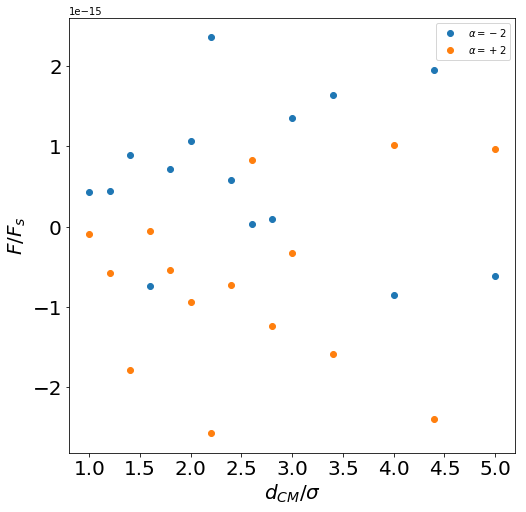

In [659]:
a=5.0
sigma=2.0*a
eta=1.0
B1=0.0015
alpha=-2.0
Fs=6.0*np.pi*eta*a*0.66*B1    # Stokes law for drag force of a spherical particle in a fluid

dist1=[10.0,12.0,14.0,16.0,18.0,20.0,22.0,24.0,26.0,28.0,30.0,34.0,40.0,44.0,50.0]
dist=np.asarray(dist1)/sigma


plt.figure(figsize=(8, 8))
plt.xlabel('$d_{CM}/\sigma$',fontsize=20)
plt.ylabel('$F/F_{s}$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)


plt.plot(dist,np.asarray(force_av_pushers_3[:,0,0]/Fs),'o')
#plt.plot(dist,np.asarray(force_av_pullers_3[:,1,2]/Fs),'o')
#plt.plot(dist,np.asarray(force_av_neutrals_3[:,1,2]/Fs),'o')

plt.plot(dist,np.asarray(force_av_pushers_3[:,1,0]/Fs),'o')
#plt.plot(dist,np.asarray(force_av_pullers_3[:,0,2]/Fs),'o')
#plt.plot(dist,np.asarray(force_av_neutrals_3[:,0,2]/Fs),'o')

plt.legend([r"$\alpha=-2$",r"$\alpha=+2$", r"$\alpha=0$"],shadow='True',fontsize='20')


plt.savefig('FORCE_2_C2_0_squirmer_x.png')  



NameError: name 'force_av_neutrals' is not defined

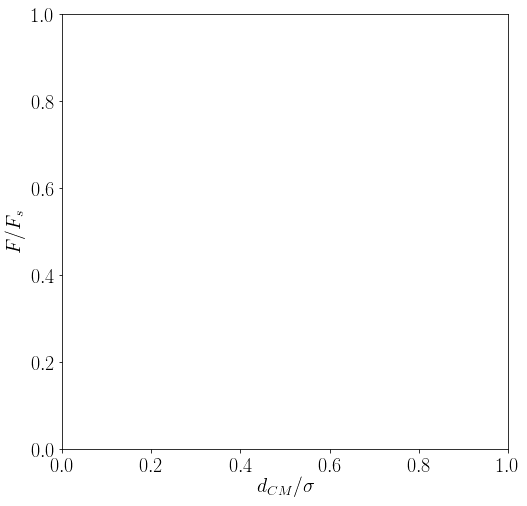

In [125]:
a=5.0
sigma=2.0*a
eta=1.0
B1=0.0015
alpha=-2.0
Fs=6.0*np.pi*eta*a*0.66*B1    # Stokes law for drag force of a spherical particle in a fluid

dist1=[10.0,12.0,14.0,16.0,18.0,20.0,22.0,24.0,26.0,28.0,30.0,34.0,40.0,44.0,50.0]
dist=np.asarray(dist1)/sigma


plt.figure(figsize=(8, 8))
plt.xlabel('$d_{CM}/\sigma$',fontsize=20)
plt.ylabel('$F/F_{s}$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)


plt.plot(dist,np.asarray(force_av_neutrals[:,0,2]/Fs),'o')
plt.plot(dist,np.asarray(force_av_neutrals_2[:,0,2]/Fs),'o')
plt.plot(dist,np.asarray(force_av_neutrals_3[:,0,2]/Fs),'o')

plt.legend([r"opposite $C_{2}$",r"same $C_{2}$", r"$C_{2}=0$"],shadow='True',fontsize='20')

[1. 1. 1.]


/Users/federico/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in log
/Users/federico/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in log
/Users/federico/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:794: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


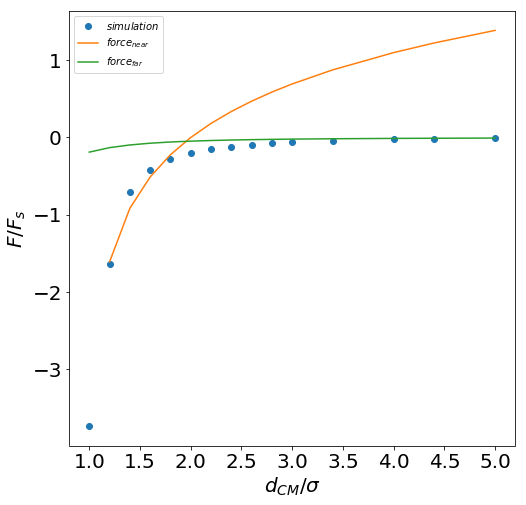

In [10]:
a=5.0
sigma=2.0*a
eta=1.0
B1=0.0015
alpha=-2.0
Fs=6.0*np.pi*eta*a*0.66*B1    # Stokes law for drag force of a spherical particle in a fluid

dist1=[10.0,12.0,14.0,16.0,18.0,20.0,22.0,24.0,26.0,28.0,30.0,34.0,40.0,44.0,50.0]
dist=np.asarray(dist1)/sigma


force_far=((3.0*np.pi*sigma**3*alpha*B1)/(16.0*np.asarray(dist1)**2))/Fs # Gompper and John's papers

plt.figure(figsize=(8, 8))
plt.xlabel('$d_{CM}/\sigma$',fontsize=20)
plt.ylabel('$F/F_{s}$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)


plt.plot(dist,np.asarray(force_av_pushers_3[:,1,1]/Fs),'o')



def func(x,a,b,c):
    return a*np.log((x-b)/c)


popt, pcov = curve_fit(func, dist, force_av_pushers_3[:,1,1])


plt.plot(dist,func(dist,*popt))

plt.plot(dist,force_far)

print(popt)

plt.legend([r"$simulation$",r"$force_{near}$", r"$force_{far}$"],shadow='True',fontsize='20')

# System with lots of squirmers

## Analysis of lots of squirmers -- polar order parameter

$P=\left \langle \frac{1}{N_{p}} \left | \sum_{i}^{N_{p}} \mathbf{\hat{e}}_{i}\right |\right \rangle$

where $\mathbf{\hat{e}}_{i}$ is the swimming direction of particle $i$, $N_{p}$ the number of particles and angular brackets denote average over time (after steady state has been reached). 
<br>
The formula above comes from formula (8) $\textit{N. Oyama et al. Eur. Phys. J. E (2017) 40, 95}$.
<br>
Another reference is $\textit{F. Alarcon et al. J. Mol. Liq. 185 (2013) 56-61}$.

0.029121019182565305


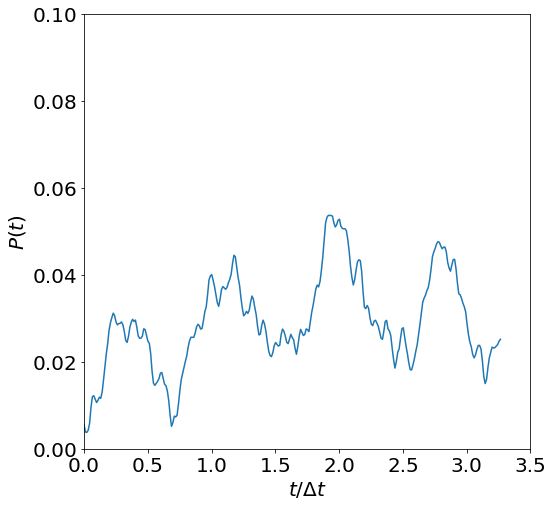

In [291]:
n_frames=301
Np=1000 #number of squirmers in the system

rf = "/Users/federico/mnt/ebi/kapsel3/1000_squirmers/1/1/output/data.h5"
f = h5py.File(rf, 'r')

Q=np.zeros((((n_frames,1000,3,3))))
TIME=np.zeros(n_frames)
P=np.zeros(n_frames)
QX=np.zeros(n_frames)
QY=np.zeros(n_frames)
QZ=np.zeros(n_frames)

for n in range (0,n_frames): 
    
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    Q[n,:,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/QR'].value
    
    for m in range(0,1000):
        
        QX[n] += Q[n,m,0,2]
        QY[n] += Q[n,m,1,2]
        QZ[n] += Q[n,m,2,2]
        
    P[n]=np.sqrt((QX[n]**2+QY[n]**2+QZ[n]**2))/Np
    
p_av=np.average(P[:])  
print(p_av)
        
plt.figure(figsize=(8, 8))
plt.xlabel('$t/\Delta t$',fontsize=20)
plt.ylabel('$P(t)$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)  
plt.xlim((0,3.5))
plt.ylim((0.0,0.1))

plt.plot((np.asarray(TIME[:])/100000),P[:])

## Analysis of lots of squirmers -- mean square displacement

$MDS=\left \langle (x-x_{0})^{2} \right \rangle=\frac{1}{N}\sum_{i=1}^{N}(x_{n}(t)-x_{n}(0))^{2}$

where N is the total number of particle of the system, $x_{n}(0)=x_{0}$ is the reference position of each particle and $x_{n}(t)$ is the position of each particle in determined time $t$. This formula comes from:
https://en.wikipedia.org/wiki/Mean_squared_displacement.
<br>
Another definition is:

$\Delta_{cm} ^{2}(\Delta t)=\frac{1}{N}\sum_{i=1}^{N}\left \langle (\mathbf{r}_{cm,i}(t+\Delta t )-\mathbf{r}_{cm,i}(t))^{2}\right \rangle$

taken from $\textit{Eur. Phys. J. E (2018) $\textbf{41}$:128}$.

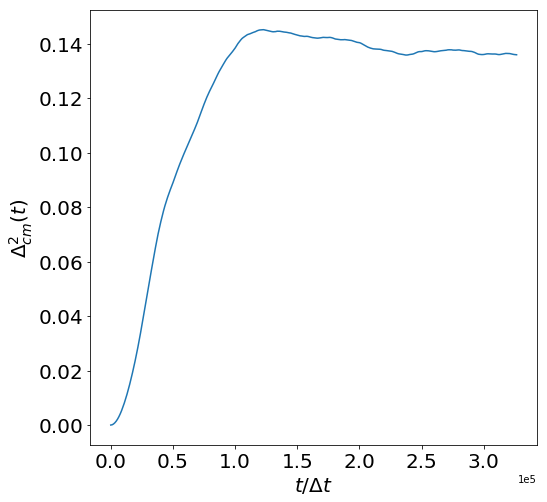

In [520]:
Np=1000
n_frames=301

rf = "/Users/federico/mnt/ebi/kapsel3/1000_squirmers/2/2/output/data.h5"
f = h5py.File(rf, 'r')

Lx=64
Ly=128
Lz=64
CM=np.zeros(((n_frames,1000,3)))
TIME=np.zeros(n_frames)
#r=np.zeros(Np)
#r0=np.zeros(Np)
SUM=np.zeros(n_frames)
MDS=np.zeros(n_frames)
QX=np.zeros(n_frames)
QY=np.zeros(n_frames)
QZ=np.zeros(n_frames)

for n in range (0,n_frames): 
    
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    CM[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    
    for m in range(0,1000):
        
        if(abs(CM[n,m,0]-CM[0,m,0]) < 0.5*Lx):   #Periodic boundary conditions check
            rx=CM[n,m,0]-CM[0,m,0]
        else:
            rx=Lx-abs(CM[n,m,0]-CM[0,m,0])
            
        if(abs(CM[n,m,1]-CM[0,m,1]) < 0.5*Ly):
            ry=CM[n,m,1]-CM[0,m,1]
        else:
            ry=Ly-abs(CM[n,m,1]-CM[0,m,1])
         
        if(abs(CM[n,m,2]-CM[0,m,2]) < 0.5*Lz):
            rz=CM[n,m,2]-CM[0,m,2]
        else:
            rz=Lz-abs(CM[n,m,2]-CM[0,m,2])
            
        SUM[n] += rx**2+ry**2+rz**2

        
    MDS[n]=SUM[n]/(15000*Np) #Divide for Delta t=15000 and the total number of particles
    
        
plt.figure(figsize=(8, 8))
plt.xlabel('$t/\Delta t$',fontsize=20)
plt.ylabel('$\Delta^{2}_{cm}(t)$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)  
#plt.xlim((0,4))
#plt.ylim((0.0,0.015))
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))



plt.plot(TIME[:],MDS[:])

#def func(x,a):
    #return x**a

#popt, pcov = curve_fit(func, TIME, MDS)

#plt.plot(TIME,func(TIME,*popt))

#print(popt)




## Analysis of lots of squirmers -- rotational square displacement

$\Delta_{\theta} ^{2}(\Delta t)=\frac{1}{N}\sum_{i=1}^{N}\left \langle (\boldsymbol{\theta}_{i}(t+\Delta t )-\boldsymbol{\theta}_{i}(t))^{2}\right \rangle$

taken from $\textit{Eur. Phys. J. E (2018) $\textbf{41}$:128}$.

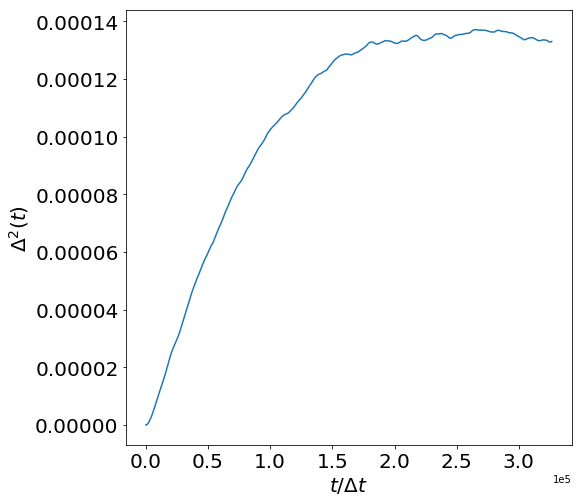

In [485]:
Np=1000
n_frames=301

rf = "/Users/federico/mnt/ebi/kapsel3/1000_squirmers/0/1/output/data.h5"
f = h5py.File(rf, 'r')

QR=np.zeros((((n_frames,1000,3,3))))
TIME=np.zeros(n_frames)
#r=np.zeros(Np)
#r0=np.zeros(Np)
SUM=np.zeros(n_frames)
theta=np.zeros(n_frames)
QX=np.zeros(n_frames)
QY=np.zeros(n_frames)
QZ=np.zeros(n_frames)

for n in range (0,n_frames): 
    
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    QR[n,:,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/QR'].value
    
    for m in range(0,1000):
        
        q_q0=np.sqrt((QR[n,m,0,2]-QR[0,m,0,2])**2+(QR[n,m,1,2]-QR[0,m,1,2])**2+(QR[n,m,2,2]-QR[0,m,2,2])**2)
        SUM[n] += (q_q0)**2
        
    theta[n]=SUM[n]/(15000*Np) #Divide for Delta t=15000 and Np=1000
    
        
plt.figure(figsize=(8, 8))
plt.xlabel('$t/\Delta t$',fontsize=20)
plt.ylabel('$\Delta^{2}(t)$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)  
#plt.xlim((0,1))
#plt.ylim((0.0,0.1))
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))


plt.plot(TIME[:],theta[:])


#def func(x,a):
    #return x**a

#popt, pcov = curve_fit(func, TIME, theta)

#plt.plot(TIME,func(TIME,*popt))

#print(popt)

## Analysis of lots of squirmers -- auto-correlation  functions

$C_{V }(t)=\left \langle \mathbf{V}(t)\cdot \mathbf{V}(t_{0}) \right \rangle$
<br>
$C_{\Omega }(t)=\left \langle \mathbf{\Omega}(t)\cdot \mathbf{\Omega}(t_{0}) \right \rangle$
<br>
$C_{V}^{||}(t)=\left \langle \mathbf{V}^{||}(t)\cdot \mathbf{V}^{||}(t_{0}) \right \rangle$
<br>
$\tilde{C}_{V}^{||}(t)=\left \langle \mathbf{\tilde{V}}^{||}(t)\cdot \mathbf{\tilde{V}}^{||}(t_{0}) \right \rangle$
<br>
$\tilde{C}_{V}^{\perp }(t)=\left \langle \mathbf{\tilde{V}}^{\perp }(t)\cdot \mathbf{\tilde{V}}^{\perp }(t_{0}) \right \rangle$

formulas $(39)-(43)$ of $\textit{J.J. Molina et al., Soft Matter, 2013, $9$, 4923}$.

/Users/federico/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in true_divide


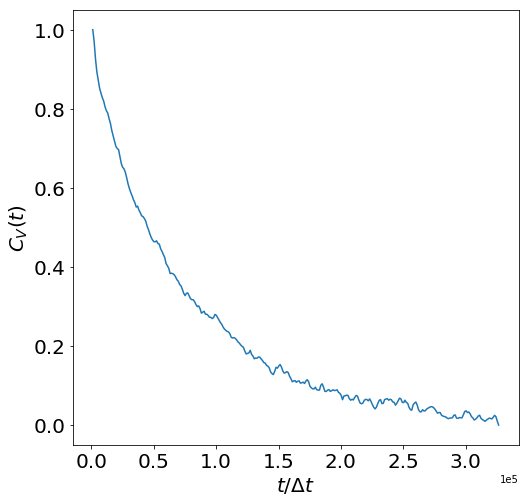

In [495]:
#Computing CV:

Np=1000
n_frames=301

rf = "/Users/federico/mnt/ebi/kapsel3/1000_squirmers/-0.5/2/output/data.h5"
f = h5py.File(rf, 'r')

TIME=np.zeros(n_frames)
V=np.zeros(((n_frames,1000,3)))
CV=np.zeros(n_frames)
CV0=np.zeros(n_frames)
#r=np.zeros(Np)
#r0=np.zeros(Np)
SUM=np.zeros(n_frames)
SUM0=np.zeros(n_frames)
theta=np.zeros(n_frames)
QX=np.zeros(n_frames)
QY=np.zeros(n_frames)
QZ=np.zeros(n_frames)

for n in range (0,n_frames): 
    
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    V[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    
    for m in range(0,1000):
        
        SUM[n] += V[n,m,0]*V[1,m,0]+V[n,m,1]*V[1,m,1]+V[n,m,2]*V[1,m,2]
        SUM0[n] += V[1,m,0]*V[1,m,0]+V[1,m,1]*V[1,m,1]+V[1,m,2]*V[1,m,2] # t0=15000 of the first frame. If t0=0 V=0!
        
    CV[n]=SUM[n]/Np
    CV0[n]=SUM0[n]/Np
        
plt.figure(figsize=(8, 8))
plt.xlabel('$t/\Delta t$',fontsize=20)
plt.ylabel('$C_{V}(t)$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)  
#plt.xlim((0,1))
#plt.ylim((0.0,0.1))
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))


plt.plot(TIME[:],CV[:]/CV0[:])


In [26]:
#Computing C_omega

Np=1000
n_frames=301

rf = "/Users/federico/mnt/ebi/kapsel3/1000_squirmers/-0.5/2/output/data.h5"
f = h5py.File(rf, 'r')

TIME=np.zeros(n_frames)
#QR=np.zeros((((301,1000,3,3)))
C=np.zeros(n_frames)
C0=np.zeros(n_frames)
#r=np.zeros(Np)
#r0=np.zeros(Np)
SUM=np.zeros(n_frames)
SUM0=np.zeros(n_frames)


for n in range (0,n_frames): 
    
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    QR[n,:,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/QR'].value
    
    for m in range(0,1000):
        
        SUM[n] += QR[n,m,0,2]*QR[1,m,0,2]+QR[n,m,1,2]*QR[1,m,1,2]+QR[n,m,2,2]*QR[1,m,2,2]
        SUM0[n] += QR[1,m,0,2]*QR[1,m,0,2]+QR[1,m,1,2]*QR[1,m,1,2]+QR[1,m,2,2]*QR[1,m,2,2] # t0=15000 of the first frame. If t0=0 V=0!
        
    C[n]=SUM[n]/Np
    C0[n]=SUM0[n]/Np
        
plt.figure(figsize=(8, 8))
plt.xlabel('$t/\Delta t$',fontsize=20)
plt.ylabel('$C_{V}(t)$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)  
#plt.xlim((0,1))
#plt.ylim((0.0,0.1))
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))


plt.plot(TIME[:],C[:]/C0[:])

def func(x,a,b,c):
    return np.exp(a*x)/b+c

popt, pcov = curve_fit(func, TIME, theta)

plt.plot(TIME,func(TIME,*popt))

print(popt)


NameError: name 'QR' is not defined

0.0009833798332988357


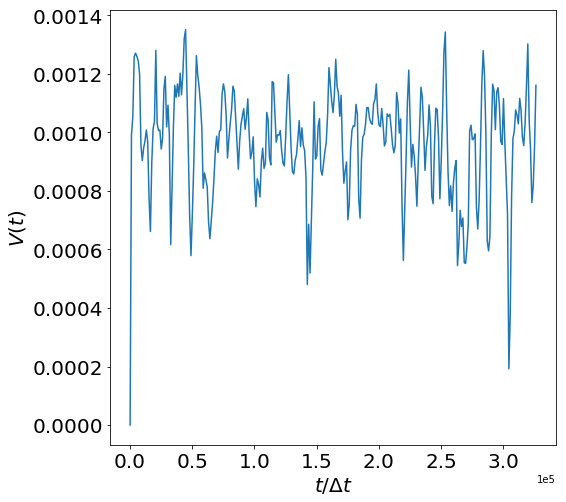

In [453]:
#################

rf = "/Users/federico/mnt/ebi/kapsel3/1000_squirmers/0/1/output/data.h5"
f = h5py.File(rf, 'r')

n_frames=301

TIME=np.zeros(n_frames)
V=np.zeros(((n_frames,1000,3)))
VTOT=np.zeros((n_frames,1000))
CV=np.zeros(n_frames)
CV0=np.zeros(n_frames)
#r=np.zeros(Np)
#r0=np.zeros(Np)
SUM=np.zeros(n_frames)
SUM0=np.zeros(n_frames)
theta=np.zeros(n_frames)
QX=np.zeros(n_frames)
QY=np.zeros(n_frames)
QZ=np.zeros(n_frames)

for n in range (0,n_frames): 
    
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    V[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    
    VTOT[n,:]=np.sqrt(V[n,:,0]**2+V[n,:,1]**2+V[n,:,2]**2)


print(np.average(VTOT[:,100],axis=0))

plt.figure(figsize=(8, 8))
plt.xlabel('$t/\Delta t$',fontsize=20)
plt.ylabel('$V(t)$',fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)  
#plt.xlim((0,1))
#plt.ylim((0.0,0.1))
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))


plt.plot(TIME[:],VTOT[:,900]) 



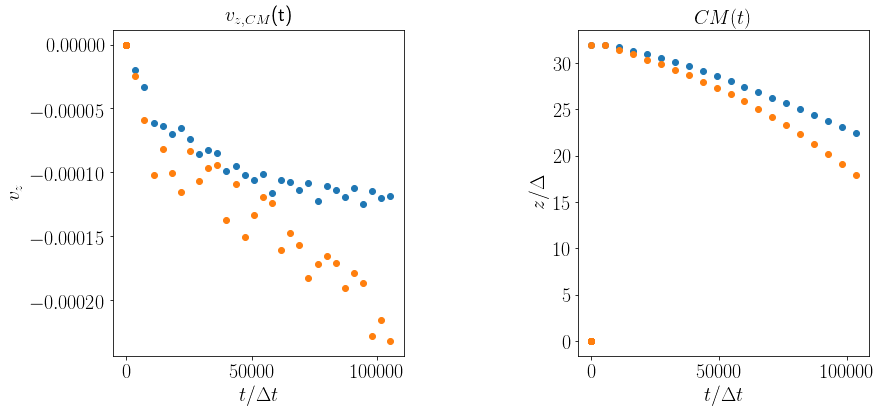

In [20]:
# Plotting the velocity of the squirmer (U=2/3B1) vs time (left plot):
# Plotting the position of the squirmer vs time (right plot):

n_frames=300
rf = "/Users/federico/mnt/ebi/kapsel3/2_squirmers_interaction/2/14/output/data.h5"
f = h5py.File(rf, 'r')

rg = "/Users/federico/mnt/ebi/kapsel3/2_squirmers_interaction/R_2/output/data.h5"
g = h5py.File(rg, 'r')

fig,  (ex,fx) = plt.subplots(1,2,figsize=(15,6))
fig.subplots_adjust(left=0.2, wspace=0.6)


ex.set_xlabel('$t/\Delta t$',fontsize=20)
ex.set_ylabel('$v_z$',fontsize=20)
ex.tick_params(axis='both',labelsize=20)
ex.set_title('$v_{z,CM}$(t)',size=20)
#ex.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

TIME=np.zeros(n_frames)
V1=np.zeros(((n_frames,2,3)))
V2=np.zeros(((n_frames,2,3)))



for n in range (0,n_frames,10):
    TIME[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    V1[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/vel'].value
    V2[n,:,:]=g['trajectory_data/frame_'+str(n)+'/particle/vel'].value



ex.plot(TIME,V1[:,0,0],'o')
ex.plot(TIME,V2[:,0,0],'o')



###########################################


fx.set_xlabel('$t/\Delta t$',fontsize=20)
fx.set_ylabel('$z/\Delta$',fontsize=20)
fx.tick_params(axis='both',labelsize=20)
fx.set_title('$CM(t)$',size=20)
#fx.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

TIME1=np.zeros(n_frames)
ZCM1=np.zeros(((n_frames,2,3)))
TIME2=np.zeros(n_frames)
ZCM2=np.zeros(((n_frames,2,3)))

for n in range (0,n_frames,15):
    TIME1[n]=f['trajectory_data/frame_'+str(n)].attrs['time']
    ZCM1[n,:,:]=f['trajectory_data/frame_'+str(n)+'/particle/pos'].value
    TIME2[n]=g['trajectory_data/frame_'+str(n)].attrs['time']
    ZCM2[n,:,:]=g['trajectory_data/frame_'+str(n)+'/particle/pos'].value


fx.plot(TIME1,ZCM1[:,0,0],'o')
fx.plot(TIME2,ZCM2[:,0,0],'o')


plt.show()

#fig.savefig('plotcircles.pdf')
 
    



In [9]:
np.cos(11.0*np.pi/40.0)

0.6494480483301838

In [10]:
np.sin(11.0*np.pi/40.0)

0.7604059656000308